<a href="https://colab.research.google.com/github/aviadazriel/big_data_bgu/blob/master/Final_Project_Analyze_the_effects_of_covid_19_on_Twitter.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Installs

In [ ]:
!pip install pyLDAvis
!pip install emoji
!python3 -m spacy download en

     |████████████████████████████████| 1.6MB 2.8MB/s 
     |████████████████████████████████| 552kB 16.2MB/s 
  Created wheel for pyLDAvis: filename=pyLDAvis-2.1.2-py2.py3-none-any.whl size=97712 sha256=0fcd6c8b62fd6b14e155b270942f849297d79aab797c745d2d2c756318fdc617
  Stored in directory: /root/.cache/pip/wheels/98/71/24/513a99e58bb6b8465bae4d2d5e9dba8f0bef8179e3051ac414
  Created wheel for funcy: filename=funcy-1.14-py2.py3-none-any.whl size=32042 sha256=8aa7c59c0c7eefc73ff89ebeac801669fe8ae38fe87425ff16048bc8da5bee39
  Stored in directory: /root/.cache/pip/wheels/20/5a/d8/1d875df03deae6f178dfdf70238cca33f948ef8a6f5209f2eb
Successfully built pyLDAvis funcy
     |████████████████████████████████| 51kB 1.6MB/s 
  Created wheel for emoji: filename=emoji-0.6.0-cp36-none-any.whl size=49716 sha256=7d7acb39485fad54a40373ace6adfa597cf2cf537e32b5473f508f07130eb1d4
  Stored in directory: /root/.cache/pip/wheels/46/2c/8b/9dcf5216ca68e14e0320e283692dce8ae321cdc01e73e17796
Successfully built emo

In [ ]:
!pip install turicreate

     |████████████████████████████████| 92.0MB 1.3MB/s 
     |████████████████████████████████| 3.4MB 41.5MB/s 
     |████████████████████████████████| 86.4MB 50kB/s 
     |████████████████████████████████| 327kB 46.7MB/s 
     |████████████████████████████████| 450kB 42.2MB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
     |████████████████████████████████| 3.8MB 37.4MB/s 
  Created wheel for resampy: filename=resampy-0.2.1-cp36-none-any.whl size=320848 sha256=6e10bc94f985df1420a04647e5ea04513cbae99dddf95117ca11b16a3ce110a9
  Stored in directory: /root/.cache/pip/wheels/ff/4f/ed/2e6c676c23efe5394bb40ade50662e90eb46e29b48324c5f9b
  Created wheel for gast: filename=gast-0.2.2-cp36-none-any.whl size=7542 sha256=afead8287e51afc2d9634cf1968edffa4168995cf900e87a774920a0f7c2772f
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built resampy gast
ERROR: tensorflow-probability 0.11.0 has requirement gast>=0.3.2,

#imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import warnings
import pandas as pd
pd.set_option("display.max_colwidth", 200) 
warnings.filterwarnings("ignore", category=DeprecationWarning) 
%matplotlib inline

In [ ]:
import os
import emoji
import spacy
from pylab import rcParams
from scipy.signal import savgol_filter
import _pickle as cPickle
from sklearn.decomposition import PCA
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.test.utils import get_tmpfile
from gensim.models.callbacks import CallbackAny2Vec
from gensim.models import Word2Vec
import copy
import datetime
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from collections import Counter
import pandas as pd
from tqdm import tqdm
from wordcloud import WordCloud
from dateutil import parser
from nltk.stem import WordNetLemmatizer
from plotly.offline import iplot
import seaborn as sns
import re
import nltk
import string
from wordcloud import WordCloud
from PIL import Image
import codecs
import cv2
import numpy as np
from string import punctuation 
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from collections import defaultdict
from sklearn.decomposition import LatentDirichletAllocation
import plotly.express as px
from textblob import TextBlob
import pyLDAvis
import turicreate as tc
import pyLDAvis.gensim
import matplotlib.pyplot as plt
%matplotlib inline
tqdm.pandas()
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


True

In [ ]:
# pd.options.mode.chained_assignment = None 

# Functions

##### Utils

In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

def save_pickle_object(obj, obj_name, url):
    file = open(url + obj_name + '.obj', 'wb')
    cPickle.dump(obj, file)
    print('Info: saved {o} pickle file.'.format(o=str(obj_name)))

def load_pickle_object(obj_name, url):
    file = open(url + obj_name + '.obj', 'rb')
    obj = cPickle.load(file)
    print('Info: uploading {o} pickle file.'.format(o=str(obj_name)))
    return obj

def parse_date(x):
  
  try:
    date = parser.parse(x)
  except:
    date = np.nan

  return date


def concat_dfs_by_row(list_of_dfs):
    new_list_Of_dfs = []

    if len(list_of_dfs) < 2:
        print('Error: less than two DFs.')
        return None

    for df in tqdm(list_of_dfs):
        df.reset_index(drop=True, inplace=True)
        new_list_Of_dfs.append(df)

    all_df = pd.concat(new_list_Of_dfs, axis=0, ignore_index=True)

    return all_df

def concat_dfs_by_col(list_of_dfs):
    new_list_Of_dfs = []

    if len(list_of_dfs) < 2:
        print('Error: less than two DFs.')
        return None

    row_shape = list_of_dfs[0].shape[0]
    for df in list_of_dfs:
        assert df.shape[0] == row_shape
        df.reset_index(drop=True, inplace=True)
        new_list_Of_dfs.append(df)

    all_df = pd.concat(new_list_Of_dfs, axis=1)

    return all_df

def plot_histogram(df, column, title):
    ax = sns.distplot(df[column])
    plt.suptitle(title)
    plt.show()


def get_sentiment(text):
   return  TextBlob(text).sentiment.polarity


def word_cloud(df , column, max_words=200,pic_path = None):
  all_words = df[column].dropna()
  words = " ".join(" ".join(list(all_words)).split())
  plt.subplots(figsize=(28,12))

  if pic_path is  not None:
    mask = cv2.imread(pic_path, 1)
    mask2 = np.array(Image.open(pic_path)) 
    wordcloud = WordCloud(background_color="white",#mode="RGBA",
                                max_words=max_words,mask=mask,max_font_size=256#,width=mask.shape[1],height=mask.shape[0]
                                ).generate(words)
  else:  
    wordcloud = WordCloud(background_color="white", mode="RGBA",
                              width=2048,
                              max_words=max_words,
                              height=1024,
                              collocations=False).generate(words)

  # show
  plt.imshow(wordcloud, interpolation="bilinear")
  plt.axis("off")
  plt.figure()
  if pic_path is  not None:
    plt.imshow(mask2, cmap=plt.cm.gray, interpolation='bilinear')
    plt.axis("off")
    plt.show()

def get_topics_per_doc(ldamodel, corpus):
  
  topics_df = pd.DataFrame()
  l = [ldamodel.get_document_topics(daily_tokens, minimum_probability=0) for daily_tokens in corpus]
  cols = []
  for row in tqdm(l):
    dist = []
    col = []
    for j, (topic_num, prop_topic) in enumerate(row):
      col.append('Topic '+str(topic_num))
      dist.append(prop_topic)
    
    cols.append(col)
    topics_df = topics_df.append(pd.Series(dist),ignore_index=True)
  
  assert len(set(list(map(' '.join, cols))))==1
  topics_df.columns = cols[0]
  topics_df['Topic'] = topics_df.idxmax(axis=1)

  return topics_df, cols[0]

def create_pie_chart(df, group_by_col, count_col, title):
  gb = df.groupby(by=group_by_col).count()
  gb['prec'] = gb[count_col].apply(lambda x: round((x/sum(gb[count_col]))*100,2))
  group_size = gb[count_col]
  group_labels = ['Other Tweets ' + str(gb['prec'][0]) + "%",'Covid Tweets ' + str(gb['prec'][1]) + "%"]
  custom_colors = ['skyblue','tomato']
  plt.figure(figsize = (5,5))
  plt.pie(group_size, labels = group_labels, colors = custom_colors)
  central_circle = plt.Circle((0,0), 0.5, color = 'white')
  fig = plt.gcf()
  fig.gca().add_artist(central_circle)
  plt.rc('font', size = 12)
  plt.title(title, fontsize = 15)
  plt.show()


def compute_coherence_values(dictionary, corpus, texts, limit, random_state, update_every, passes, alpha, per_word_topics, chunksize, start=2, step=3):
    import warnings
    warnings.filterwarnings("ignore",category=DeprecationWarning)
    coherence_values = []
    model_list = []
    for num_topics in tqdm(range(start, limit, step)):

        model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=random_state,
                                                update_every=update_every, chunksize=chunksize, passes=passes, alpha=alpha,
                                                per_word_topics=per_word_topics)

        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

#####Load Data & Pre-Proccess

In [ ]:
def load_data(input_url, filter_word=None, remove_leader_tweet=False, random_sample = None):
  # Get file names:
  file_list = []

  for root, dirs, files in os.walk(input_url):
    for file in files:
      file_list.append(os.path.join(root,file))

  # Filters files:
  if filter_word:
    file_list = [file for file in file_list if filter_word in file]

  # Remove files:
  if remove_leader_tweet:
    file_list = [file for file in file_list if 'trump_tweets' not in file]

  # Load files:
  dfs = []
  for file in tqdm(file_list):
    if file.split('/')[-1]=="2020_06_6.csv":
      df = pd.read_csv(file, sep='\t', engine='python')
    else:
      try:
        df = pd.read_csv(file, low_memory=False)
      except:
        print(file)
        df = pd.read_csv(file, engine='python')

    if random_sample is not None:
      df = df.sample(frac=random_sample)

    dfs.append(df)
    
  # Merge data:
  df = concat_dfs_by_row(list_of_dfs=dfs)
  print("\nDF shape is {s}".format(s=str(df.shape[0])))

  return df

def lower_text(text):
    text = text.lower()
    return text

def is_relevent_tweet(text,words_list):

  if text==str(np.nan):
    return False
  text = lower_text(text=text)
  for word in words_list:
    if word.lower() in text:
      return True
  return False

def preprocess_tweet(tweet, min_text_len=2, min_word_len=3, keywords_list=None, keywords_replacement_word=None, stem=True, remove_hashtag=True):

  tweet = tweet.lower()
  tweet = re.sub('((www\.[^\s]+)|(https?://[^\s]+)|(http?://[^\s]+))', '', tweet) 
  tweet = re.sub('@[^\s]+', '', tweet) 
  tweet = re.sub('[!"$%&\'()*+,-./:;<=>?[\\]^_`{|}~•@]+', ' ', tweet)
  tweet = re.sub('([0-9]+)', '', tweet)
  
  if remove_hashtag:
    tweet = re.sub('#[^\s]+', '', tweet) 
  else:
    tweet = tweet.replace('#', '')

  tweet = tweet.replace('amp', '')

  if (keywords_list is not None) and (keywords_replacement_word is not None):
    for key in keywords_list:
        if key.replace('#','') in tweet:    
          tweet = tweet.replace(key.replace('#','') , ' ' + str(keywords_replacement_word) + ' ')

  punctuation_list = list(string.punctuation)
  punctuation_list.append('…')
  for char in punctuation_list:
      if char in tweet:
          tweet = tweet.replace(char, '')

  tweet = re.sub('\s+', ' ', tweet)

  allchars = [str for str in tweet]
  emoji_list = [c for c in allchars if c in emoji.UNICODE_EMOJI]
  tweet = ' '.join([str for str in tweet.split() if not any(i in str for i in emoji_list)])
  tweet = re.sub(r"[^A-Za-z]+", ' ', tweet)  
  tokens = word_tokenize(tweet) 

  stop_words = stopwords.words('english')
  stop_words.extend(['from', 'subject', 're', 'edu', 'use'])
  tokens = [word for word in tokens if word not in stop_words]
  
  if stem:
    word_rooter = nltk.stem.snowball.PorterStemmer(ignore_stopwords=False).stem
    tokens = [word_rooter(word) if '#' not in word else word
                          for word in tokens]
  tokens = [word for word in tokens if len(word)>=min_word_len]

  if len(tokens)<min_text_len:
    return np.nan

  clean_tweet = ' '.join(tokens)
  
  return clean_tweet

def write_data(df, url):
    df.to_csv(url, index=False)
    print('Saved csv in {u}'.format(u=str(url)))

def reco_device(tweet):
  try:
    tweet = re.findall(r'>(.+?)<', tweet)[0]
    if 'iPhone' in tweet or ('iOS' in tweet):
        return 'iPhone'
    elif 'Android' in tweet:
        return 'Android'
    elif 'Mobile' in tweet or ('App' in tweet):
        return 'Mobile device'
    elif 'Mac' in tweet:
        return 'Mac'
    elif 'Windows' in tweet:
        return 'Windows'
    elif 'Bot' in tweet:
        return 'Bot'
    elif 'Web' in tweet:
        return 'Web'
    elif 'Instagram' in tweet:
        return 'Instagram'
    elif 'Blackberry' in tweet:
        return 'Blackberry'
    elif 'iPad' in tweet:
        return 'iPad'
    elif 'Foursquare' in tweet:
        return 'Foursquare'
    else:
        return '-'
  except:
    return None

def convertDate(d):
    try:
      new_date = datetime.datetime.strptime(d,"%d/%m/%Y %H:%M")
    except:
      new_date = datetime.datetime.strptime(d,"%Y-%m-%d %H:%M:%S")
    return new_date.date()

def preprocessing(df, random_sample = None, specific_columns = None):
  print('Start Preprocessing')
  # Filter cols:
  if specific_columns is not None:
    df = df[specific_columns]
  print('filter unknown sources')
  shape = len(df)
  df['source_clean'] = df['source'].apply(lambda x: reco_device(x))
  relevant_device = ['Web', 'Android','Mobile device', None,'iPad','iPhone']
  df = df[df['source_clean'].isin(relevant_device)]
  print(f'remove rows: {shape-len(df)}' )
  
  print('Parse Date')
  df['created_at'] = df['created_at'].apply(lambda x: parse_date(x))
  df['date'] = df['created_at'].apply(lambda x: x.date())
  
  # Remove nan values:
  df = df.dropna(subset=['created_at','id','text'])

  if random_sample is not None:
    df = df.sample(frac=random_sample)

  # Remove duplicates:
  print('Remove duplicates')
  df = df.drop_duplicates()
  df = df.sort_values('created_at') 

  # Convert dtypes:
  for col_name in ['text','State_abbv']:
    df[col_name] = df[col_name].astype(str)

  df = df.reset_index(drop=True)

  print("After pre-proccessing DF shape is {s}".format(s=str(df.shape[0])))
  return df


<input>:57: DeprecationWarning:

invalid escape sequence \.

<input>:57: DeprecationWarning:

invalid escape sequence \.

<input>:57: DeprecationWarning:

invalid escape sequence \.

<input>:57: DeprecationWarning:

invalid escape sequence \.

<input>:58: DeprecationWarning:

invalid escape sequence \s

<input>:57: DeprecationWarning:

invalid escape sequence \.

<input>:58: DeprecationWarning:

invalid escape sequence \s

<input>:57: DeprecationWarning:

invalid escape sequence \.

<input>:58: DeprecationWarning:

invalid escape sequence \s

<input>:57: DeprecationWarning:

invalid escape sequence \.

<input>:58: DeprecationWarning:

invalid escape sequence \s

<input>:57: DeprecationWarning:

invalid escape sequence \.

<input>:58: DeprecationWarning:

invalid escape sequence \s

<input>:57: DeprecationWarning:

invalid escape sequence \.

<input>:58: DeprecationWarning:

invalid escape sequence \s

<input>:57: DeprecationWarning:

invalid escape sequence \.

<input>:58: DeprecationW

#####Functions - Covid Spread in USA

In [ ]:
def get_simbol(state):
  try:
    return states_meta_data_df[states_meta_data_df['name'] == state]['state'].iloc[0]
  except:
    return None
    

def get_lng(state):
  return states_meta_data_df[states_meta_data_df['name'] == state]['longitude'].iloc[0]


def get_lat(state):
  return states_meta_data_df[states_meta_data_df['name'] == state]['latitude'].iloc[0]


def get_state_code(state, states_df):
  try:
    return states_df[states_df['State'] == state]['Code'].iloc[0]
  except:
    return np.nan

#####Functions - Analysis Of Leader's Tweets

In [ ]:
def sentiment_recognize(score):
  if score > 0:
    return 'Positive'
  elif score < 0:
    return 'Negetive'
  else:
    return 'Netural'


def find_status_id(id, id_list):

  if id==np.nan:
    return np.nan

  id = str(id)[:16].replace('.','')

  for status_id in id_list:
    if id in str(status_id):
      return str(status_id)

  return np.nan

#####Functions - Stock Tweets

In [ ]:
def load_stock_prices(sector, dict_stock_sector, url):

  stocks = dict_stock_sector[sector]

  dfs = []
  for stock in stocks:
    
    df = pd.read_csv(url+str(stock)+".csv")
    df = df.drop(columns=['Unnamed: 0'])
    df  = df.dropna()
    df['Date'] = df['Date'].apply(lambda x: pd.to_datetime(x,format= '%Y-%m-%d').date())
    df['stock'] = stock
    df['sector'] = sector
    dfs.append(df)

  if len(dfs)==1:
    return dfs[0]

  stock_df = concat_dfs_by_row(list_of_dfs=dfs)
  return stock_df

def plot_stock_sentiment(stock_gb):
  t = clean_energy_stock['date']
  sentiment = stock_gb['sentiment']
  price = stock_gb['Close']

  fig = make_subplots(specs=[[{"secondary_y": True}]])

  fig.add_trace(
      go.Scatter(x=t, y=savgol_filter(sentiment,21,3), name="Sentiment", line=dict(color='red', width=2) ),
      secondary_y=False,
  )

  fig.add_trace(
      go.Scatter(x=t, y=price, name="Price", line=dict(color='royalblue', width=2)),
      secondary_y=True,
  )

  fig.update_layout(
      title_text="{s} stock daily price and sentiment during covid-19".format(s=str(stock))
  )
  fig.update_xaxes(title_text="Day")
  fig.update_yaxes(title_text="<b>Sentiment</b>", secondary_y=False)
  fig.update_yaxes(title_text="<b>Price</b>", secondary_y=True)
  fig.show()

def plot_stock(df, stock):

  d = df[df['stock']==stock]
  t = d["Date"]
  price = d["Close"]
  volume = d["Volume"]

  # Create figure with secondary y-axis
  fig = make_subplots(specs=[[{"secondary_y": True}]])

  # Add traces
  fig.add_trace(
      go.Scatter(x=t, y=price, name="Stock Price"),
      secondary_y=False,
  )
  fig.add_trace(
      go.Scatter(x=t, y=volume, name="Volume"),
      secondary_y=True,
  )
  # Add figure title
  fig.update_layout(
      title_text=f'{stock}: Stock Price and Volume'
  )
  # Set x-axis title
  fig.update_xaxes(title_text="Date")
  # Set y-axes titles
  fig.update_yaxes(title_text="<b>Stock Price</b>", secondary_y=False)
  fig.update_yaxes(title_text="<b>Volume</b>", secondary_y=True)
  fig.show()

def recognize_sector(txt, market_relavant_words, clean_energy_relevant_words, Crude_relevant_words, Solar_Energy_relevant_words, Gasoline_relevant_word):
  txt = txt.lower()

  for word in ['tsla','tesla','elon_mask','elon mask','elonmask']:
    if word in txt:
      return 'tesla'

  for word in Gasoline_relevant_word:
    if word in txt:
      return 'Gasoline'
  
  for word in Solar_Energy_relevant_words:
    if word in txt:
      return 'Solar Energy'

  for word in Crude_relevant_words:
    if word in txt:
      return 'Crude'
  
  for word in clean_energy_relevant_words:
    if word in txt:
      return 'Clean Energy'
  
  for word in market_relavant_words:
    if word in txt:
      return 'stocks'

  if 'russian' in txt:
    return 'russian'

  if 'saudi arabia' in txt:
    return 'saudi'

  return 'unknown'

In [ ]:
output_url = "drive/My Drive/Colab Notebooks/Big Data/final_project/Output/"

#####Functions - Analysis Of Covid-19 Tweets

In [ ]:
corona_keyword = ["corona", "#corona", "coronavirus", "#coronavirus", "covid", "#covid", "covid19", "#covid19", "covid-19", "#covid-19",
"sarscov2", "#sarscov2", "sars cov2", "sars cov 2", "covid_19", "#covid_19", "#ncov", "ncov", "#ncov2019", "ncov2019",
"2019-ncov", "#2019-ncov", "pandemic", "#pandemic" "#2019ncov", "2019ncov", "quarantine", "#quarantine", "flatten the curve",
"flattening the curve", "#flatteningthecurve", "#flattenthecurve", "hand sanitizer", "#handsanitizer", "#lockdown", "lockdown",
"social distancing", "#socialdistancing", "work from home", "#workfromhome", "working from home", "#workingfromhome", "ppe",
"n95", "#ppe", "#n95", "#covidiots", "covidiots", "herd immunity", "#herdimmunity", "pneumonia", "#pneumonia", "chinese virus",
"#chinesevirus", "wuhan virus", "#wuhanvirus", "kung flu", "#kungflu", "wearamask", "#wearamask", "wear a mask", "vaccine", "vaccines",
"#vaccine", "#vaccines", "corona vaccine", "corona vaccines", "#coronavaccine", "#coronavaccines", "face shield", "#faceshield",
"face shields", "#faceshields", "health worker", "#health worker", "health workers", "#healthworkers", "#stayhomestaysafe",
"#coronaupdate", "#frontlineheroes", "#coronawarriors", "#homeschool", "#homeschooling", "#hometasking", "#masks4all",
"#wfh", "wash ur hands", "wash your hands", "#washurhands", "#washyourhands", "#stayathome", "#stayhome", "#selfisolating",
"self isolating", "bars closed", "restaurants closed"]




def get_topics_per_doc(ldamodel, corpus):
  
  topics_df = pd.DataFrame()
  l = [ldamodel.get_document_topics(daily_tokens, minimum_probability=0) for daily_tokens in corpus]
  cols = []
  for row in tqdm(l):
    dist = []
    col = []
    for j, (topic_num, prop_topic) in enumerate(row):
      col.append('Topic '+str(topic_num))
      dist.append(prop_topic)
    
    cols.append(col)
    topics_df = topics_df.append(pd.Series(dist),ignore_index=True)

  assert len(set(list(map(' '.join, cols))))==1
  topics_df.columns = cols[0]
  topics_df['Topic'] = topics_df.idxmax(axis=1)
  return topics_df, cols[0]

#Word Embedding

In [ ]:
data_path = './all_together.csv'
sf = tc.SFrame('./all_together.csv') 

Finished parsing file /content/all_together.csv

Parsing completed. Parsed 100 lines in 1.99205 secs.

------------------------------------------------------
Inferred types from first 100 line(s) of file as 
column_type_hints=[str,float,str,str,float,float,float,str,str,int,str,str,str]
If parsing fails due to incorrect types, you can correct
the inferred type list above and pass it to read_csv in
the column_type_hints argument
------------------------------------------------------


Read 154516 lines. Lines per second: 79994.9

Read 772377 lines. Lines per second: 102729

Read 1390504 lines. Lines per second: 105616

Read 2009030 lines. Lines per second: 106869

Read 2590027 lines. Lines per second: 105954

Read 3155400 lines. Lines per second: 104903

Read 3721370 lines. Lines per second: 104272

Read 4286885 lines. Lines per second: 103702

Read 4871985 lines. Lines per second: 103597

Read 5521708 lines. Lines per second: 104642

Read 6171255 lines. Lines per second: 105490

Read 6821034 lines. Lines per second: 106293

Read 7470826 lines. Lines per second: 106849

Read 8120605 lines. Lines per second: 107306

Read 8770305 lines. Lines per second: 107705

Read 9419285 lines. Lines per second: 107965

Read 10068291 lines. Lines per second: 108311

Read 10717682 lines. Lines per second: 108504

Read 11366824 lines. Lines per second: 108713

Read 12016042 lines. Lines per second: 108936

Read 12665284 lines. Lines per second: 109131

Read 13314488 lines. Lines per second: 109276

Read 13963704 lines. Lines per second: 109445

Read 14613181 lines. Lines per second: 109565

Read 15262831 lines. Lines per second: 109688

Read 15912248 lines. Lines per second: 109728

Read 16561830 lines. Lines per second: 109755

Read 17211073 lines. Lines per second: 109874

Read 17860455 lines. Lines per second: 109973

Read 18509884 lines. Lines per second: 109670

Read 19159245 lines. Lines per second: 109773

Read 19808353 lines. Lines per second: 109860

Read 20457902 lines. Lines per second: 109937

Read 21107694 lines. Lines per second: 110009

Read 21757463 lines. Lines per second: 110088

Read 22407195 lines. Lines per second: 110146

Read 23057171 lines. Lines per second: 110205

Read 23706948 lines. Lines per second: 110234

Read 24356796 lines. Lines per second: 110231

Read 25006166 lines. Lines per second: 110238

Read 25655901 lines. Lines per second: 110262

Read 26305759 lines. Lines per second: 110289

Read 26955059 lines. Lines per second: 110340

Read 27604846 lines. Lines per second: 110367

Read 28254286 lines. Lines per second: 110417

Read 28903544 lines. Lines per second: 110444

Read 29552777 lines. Lines per second: 110473

Read 30202089 lines. Lines per second: 110496

Read 30851614 lines. Lines per second: 110546

Read 31501029 lines. Lines per second: 110583

Read 32150349 lines. Lines per second: 110605

Read 32799510 lines. Lines per second: 110617

Read 33448910 lines. Lines per second: 110643

Read 34098323 lines. Lines per second: 110668

Read 34747576 lines. Lines per second: 110696

Read 35397182 lines. Lines per second: 110725

Read 36014137 lines. Lines per second: 110666

Finished parsing file /content/all_together.csv

Parsing completed. Parsed 36511676 lines in 328.79 secs.

In [ ]:
sf = preprocessing(sf)
sf_pre.materialize()

Start Preprocessing
drop nan values 
filter unknown sources
remove rows: 0
Parse Date
After pre-proccessing DF shape is 37424902


In [ ]:
sf = sf[['text']]
sf

text
Trump to order meatplants to stay open in ...
You know one thing I'velearned during this ...
We need to stop killingpeople so the world can ...
Uhmmm there is a pandemicon bro ...
Reset the atmosphere inyour home. It’s time to ...
@Stonedlilshit You’ll beimmune to corona ...
I'm done. The Coronalockdown is absolute ...
The Last of Us 2 has beendelayed ...
@clubjade @admiraljello@eleventhirtyate A anti- ...
@BeschlossDC His pollnumbers are about to ...


In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
sf['clean_text'] = sf['text'].apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len, min_word_len=min_word_len))     
sf = sf[['clean_text']]
sf = sf.dropna()
sf_pre.materialize()

In [ ]:
sf['tokens'] = sf['clean_text'].apply(lambda x: x.split())
sf = sf[['tokens']]
sf_pre.materialize()

In [ ]:
class EpochLogger(CallbackAny2Vec):
     '''Callback to log information about training'''

     def __init__(self):
         self.epoch = 0
     def on_epoch_begin(self, model):
         print("Epoch #{} start".format(self.epoch))
        
     def on_epoch_end(self, model):
          loss = model.get_latest_training_loss()
          print('Loss after epoch {}: {}'.format(self.epoch, loss))
          self.epoch += 1    
               
epoch_logger = EpochLogger()
tokens = sf['tokens']
w2v_model = Word2Vec(min_count=20,
                     window=2,
                     size=300,
                     sample=6e-5, 
                     alpha=0.03, 
                     min_alpha=0.0007, 
                     negative=20,
                     workers=32)
w2v_model.build_vocab(tokens, progress_per=10000)
w2v_model.train(tokens, total_examples=w2v_model.corpus_count, epochs=25,compute_loss = True, report_delay=1,callbacks=[epoch_logger])

Epoch #4 start
Loss after epoch 4: 11518110.0
Epoch #5 start
Loss after epoch 5: 21127138.0
Epoch #6 start
Loss after epoch 6: 28986498.0
Epoch #7 start
Loss after epoch 7: 36864468.0
Epoch #8 start
Loss after epoch 8: 44483000.0
Epoch #9 start
Loss after epoch 9: 52125160.0
Epoch #10 start
Loss after epoch 10: 59925376.0
Epoch #11 start
Loss after epoch 11: 67386048.0
Epoch #12 start
Loss after epoch 12: 70795368.0
Epoch #13 start
Loss after epoch 13: 74182928.0
Epoch #14 start
Loss after epoch 14: 77493104.0
Epoch #15 start
Loss after epoch 15: 80775360.0
Epoch #16 start
Loss after epoch 16: 84024376.0
Epoch #17 start
Loss after epoch 17: 87113416.0
Epoch #18 start
Loss after epoch 18: 90172904.0
Epoch #19 start
Loss after epoch 19: 93155688.0
Epoch #20 start
Loss after epoch 20: 96091336.0
Epoch #21 start
Loss after epoch 21: 98903128.0
Epoch #22 start
Loss after epoch 22: 101625104.0
Epoch #23 start
Loss after epoch 23: 104242072.0
Epoch #24 start
Loss after epoch 24: 106723888.0
E

(2701101241, 4841926675)

In [ ]:
model_path = '/content/drive/My Drive/big_data/models/word2vec/all_32M/model_w2v.wv'
w2v_model.init_sims(replace=True)
w2v_model.save(model_path)

In [ ]:
class EpochLogger(CallbackAny2Vec):
     '''Callback to log information about training'''

     def __init__(self):
         self.epoch = 0
     def on_epoch_begin(self, model):
         print("Epoch #{} start".format(self.epoch))
        
     def on_epoch_end(self, model):
          loss = model.get_latest_training_loss()
          print('Loss after epoch {}: {}'.format(self.epoch, loss))
          self.epoch += 1    
               
epoch_logger = EpochLogger()
model_path = '/content/drive/My Drive/big_data/models/word2vec/all_32M/model_w2v.wv'
model_w2v = Word2Vec.load(model_path)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning:

This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function

/usr/local/lib/python3.6/dist-packages/gensim/utils.py:488: DeprecationWarning:

Call to deprecated `cum_table` (Attribute will be removed in 4.0.0, use self.vocabulary.cum_table instead).



In [ ]:
pd.DataFrame(model_w2v.wv.most_similar(positive= "covid", topn=15), columns=['word', 'perc'])

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



,word,perc
0,coronaviru,0.907169
1,viru,0.741443
2,covi,0.701570
3,corona,0.694656
4,pandem,0.647733
5,coronavir,0.626155
6,infect,0.618410
7,outbreak,0.616178
8,cov,0.607280
9,coronavi,0.604440


In [ ]:
pd.DataFrame(model_w2v.wv.most_similar(positive= "trump", topn=15), columns=['word', 'perc'])

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



,word,perc
0,djt,0.844224
1,trum,0.829876
2,donald,0.797426
3,potu,0.793848
4,presid,0.772062
5,obama,0.730265
6,biden,0.725592
7,drumpf,0.719045
8,gop,0.715969
9,democrat,0.694245


In [ ]:
simliar_covid = model_w2v.wv.most_similar(positive= "covid", topn=1000)
simliar_virus = model_w2v.wv.most_similar(positive= "viru", topn=100)
similar_corona = model_w2v.wv.most_similar(positive= "corona", topn=1000)
similar_pandemic = model_w2v.wv.most_similar(positive= "pandemi", topn=100)
similar_trump = model_w2v.wv.most_similar(positive= "trump", topn=1000)
similar_obama = model_w2v.wv.most_similar(positive= "obama", topn=100)
similar_biden = model_w2v.wv.most_similar(positive= "biden", topn=100)
word_similar_to_covid = []
word_similar_to_trump = []

for i in simliar_covid:
  word_similar_to_covid.append(i[0])
for i in similar_corona:
  word_similar_to_covid.append(i[0])
for i in similar_pandemic:
  word_similar_to_covid.append(i[0])
for i in similar_trump:
  word_similar_to_trump.append(i[0])
for i in similar_obama:
  word_similar_to_trump.append(i[0])
for i in similar_biden:
  word_similar_to_trump.append(i[0])
for i in simliar_virus:
  word_similar_to_covid.append(i[0])

/usr/local/lib/python3.6/dist-packages/gensim/matutils.py:737: FutureWarning:

Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.



In [ ]:
model_path = '/content/drive/My Drive/big_data/models/word2vec/all_32M_TRAINABLE/model_w2v.wv'
model_w2v = Word2Vec.load(model_path)

In [ ]:
# and term counts from the food2vec model vocabulary
ordered_vocab = [(term, voc.index, voc.count)
                 for term, voc in model_w2v.wv.vocab.items()]

# sort by the term counts, so the most common terms appear first
ordered_vocab = sorted(ordered_vocab, key=lambda x: -x[2])

# unzip the terms, integer indices, and counts into separate lists
ordered_terms, term_indices, term_counts = zip(*ordered_vocab)
# create a DataFrame with the word2vec vectors as data,
# and the terms as row labels
word_vectors = pd.DataFrame(model_w2v.wv.syn0[:],
                            index=ordered_terms)

In [ ]:
from sklearn.manifold import TSNE
tsne_input = word_vectors
tsne = TSNE()
tsne_vectors = tsne.fit_transform(tsne_input.values)

In [ ]:
tsne_vectors = pd.DataFrame(tsne_vectors,
                            index=pd.Index(tsne_input.index),
                            columns=[u'x_coord', u'y_coord'])
tsne_vectors.head()

,x_coord,y_coord
like,-9.526600,31.574726
get,-35.005939,8.151650
one,-3.435872,14.862154
know,8.722086,35.206238
peopl,9.958413,39.812420


In [ ]:
tsne_vectors[u'word'] = tsne_vectors.index

In [ ]:
recognize = []
for i in tsne_vectors[u'word']:
  if i in word_similar_to_covid:
    recognize.append(1)
  elif i in word_similar_to_trump:
    recognize.append(2)
  else:
     recognize.append(0)
tsne_vectors['type'] = recognize
Counter(recognize)

Counter({0: 74338, 1: 1599, 2: 958})

In [ ]:
import plotly.express as px
%matplotlib inline
fig = px.scatter(tsne_vectors, x="x_coord", y="y_coord",hover_name="word",  color="type")
fig.show()

# Covid Spread in USA

In [ ]:
# Load data:
covid_spread_state_df = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Data/BGU DATA/Covid Spread/covid_spread_us.csv")
states_df = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Data/BGU DATA/Covid Spread/us_states.csv")

In [ ]:
# Data preprocessing:
covid_spread_state_df['state_code'] = covid_spread_state_df['state'].apply(lambda x: get_state_code(state=x, states_df=states_df))  
covid_spread_state_df = covid_spread_state_df.dropna(subset=['state_code'])
covid_spread_state_df['cases'].astype(int)
covid_spread_state_df['deaths'].astype(int)
covid_spread_state_df['datetime'] = covid_spread_state_df['date'].astype('datetime64[ns]')
covid_spread_state_df['week_num'] = covid_spread_state_df['datetime'].apply(lambda x: x.strftime("%V"))
covid_spread_state_df.head(1)

,date,state,fips,cases,deaths,state_code,datetime,week_num
0,2020-01-21,Washington,53,1,0,WA,2020-01-21,04


In [ ]:
# Compute cases per day:
cases = []
deaths = []
counter = 0
for i,row in covid_spread_state_df.iterrows():
  case = row['cases']
  death = row['deaths']
  state = row['state']
  if counter==0:
    cases.append(case)
    deaths.append(death)
  else:
    df_tmp = covid_spread_state_df[:counter]
    df_state_tmp = df_tmp[df_tmp['state']==state][-1:]
    if len(df_state_tmp)==0:
      cases.append(case)
      deaths.append(death)
    else:
      last_cases = df_state_tmp.iloc[0]['cases']
      last_death = df_state_tmp.iloc[0]['deaths']
      cases.append(case - last_cases)
      d = death - last_death
      if d<0:
        d= d = 0
      deaths.append(d)
  counter +=1
covid_spread_state_df['cases_per_day'] = cases
covid_spread_state_df['deaths_per_day'] = deaths
covid_spread_state_df = covid_spread_state_df.rename(columns={"cases_per_day": 'covid cases', "deaths_per_day": 'covid deaths'})

In [ ]:
# Get Coronavirus daily spread:
corona_per_dates_gb = covid_spread_state_df.groupby(by="date").sum().reset_index()
t = corona_per_dates_gb['date']
cases = corona_per_dates_gb['covid cases']
deaths = corona_per_dates_gb['covid deaths']

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(deaths,21,5), name="Deaths", line=dict(color='red', width=2) ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(cases,11,3), name="Cases", line=dict(color='royalblue', width=2)),
    secondary_y=True,
)

fig.update_layout(
    title_text="Coronavirus daily spread in USA"
)
fig.update_xaxes(title_text="Day")
fig.update_yaxes(title_text="<b>Covid-19 Deaths</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Covid-19 Cases</b>", secondary_y=True)
fig.show()

In [ ]:
# USA covid tweets sentiment:
covid_spread_state_gb = covid_spread_state_df.groupby(by=['date','state_code']).sum().reset_index()
covid_spread_state_gb = covid_spread_state_gb.rename(columns={'state_code': 'State_abbv'})
px.choropleth(covid_spread_state_gb, locations='State_abbv',
              locationmode='USA-states', scope="usa", color='cases',animation_frame="date", color_continuous_scale="Reds", title="Covid cases spread in USA states")

In [ ]:
# Save dfs:
output_url = "drive/My Drive/Colab Notebooks/Big Data/final_project/Output/"
write_data(covid_spread_state_df, url=output_url+"covid_spread_state_df.csv")
write_data(covid_spread_state_gb, url=output_url+"covid_spread_state_gb.csv")
write_data(corona_per_dates_gb, url=output_url+"corona_per_dates_gb.csv")

Saved csv in drive/My Drive/Colab Notebooks/Big Data/final_project/Output/covid_spread_state_df.csv
Saved csv in drive/My Drive/Colab Notebooks/Big Data/final_project/Output/covid_spread_state_gb.csv
Saved csv in drive/My Drive/Colab Notebooks/Big Data/final_project/Output/corona_per_dates_gb.csv


# Analysis of leaders’ tweets

##Trump tweets

###Trump tweets

In [ ]:
# Load trump tweets:
trump_df = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Data/BGU DATA/Leaders Tweets and Retweets/trump_tweets.csv")
trump_df.tail(5)

,date,username,to,replies,retweets,favorites,text,geo,mentions,hashtags,id,permalink
5834,10/06/2019 13:33,realDonaldTrump,NaN,3206,10092,40130,NaN,NaN,NaN,NaN,1.138080e+18,https://twitter.com/realDonaldTrump/status/113...
5835,10/06/2019 11:09,realDonaldTrump,NaN,19449,19071,79280,When will the Failing New York Times admit tha...,NaN,NaN,NaN,1.138040e+18,https://twitter.com/realDonaldTrump/status/113...
5836,10/06/2019 10:31,realDonaldTrump,NaN,5943,15447,81033,....We do not anticipate a problem with the vo...,NaN,NaN,NaN,1.138030e+18,https://twitter.com/realDonaldTrump/status/113...
5837,10/06/2019 10:31,realDonaldTrump,NaN,8093,19297,95790,We have fully signed and documented another ve...,NaN,NaN,NaN,1.138030e+18,https://twitter.com/realDonaldTrump/status/113...
5838,10/06/2019 10:00,realDonaldTrump,NaN,7553,16492,67339,"Now with our new deal, Mexico is doing more fo...",NaN,NaN,NaN,1.138020e+18,https://twitter.com/realDonaldTrump/status/113...


In [ ]:
# Data preprocessing:
trump_df = trump_df.rename(columns={'date': 'created_at'})
trump_df['created_at'] = trump_df['created_at'].apply(lambda x: convertDate(str(x)))
trump_df = trump_df.sort_values("created_at")
trump_df = trump_df.dropna(subset=['created_at','id','text'])
trump_df['status_id'] = trump_df['permalink'].apply(lambda x: x.split('/')[-1])

In [ ]:
# Tag corona tweets:
trump_df['covid_tweet'] = trump_df['text'].apply(lambda x: is_relevent_tweet(text=x,words_list=corona_keyword))

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
trump_df['clean_text'] = trump_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len, min_word_len=min_word_len, stem=True))
trump_df['clean_text_no_stem'] = trump_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len, min_word_len=min_word_len, stem=False))
trump_df = trump_df[~trump_df['clean_text'].isna()]

100%|██████████| 5399/5399 [00:02<00:00, 2465.26it/s]


In [ ]:
# Extract sentiment:
trump_df['sentiment'] = trump_df['clean_text'].apply(lambda x: get_sentiment(x))  
trump_df['sentiment_desc'] = trump_df['sentiment'].apply(lambda x: sentiment_recognize(x))

In [ ]:
def get_subjectivity(text):
  return  TextBlob(text).sentiment.subjectivity
trump_df['subjectivity'] = trump_df['clean_text'].apply(lambda t: get_subjectivity(t))

In [ ]:
# Create pie of trump tweet sentiment:
import plotly.express as px
counts = Counter(trump_df['sentiment_desc'])
fig = px.pie( values=[float(v) for v in counts.values()], names=[k for k in counts]
                                  ,title='Trump\'s tweets sentiment description')
fig.show()

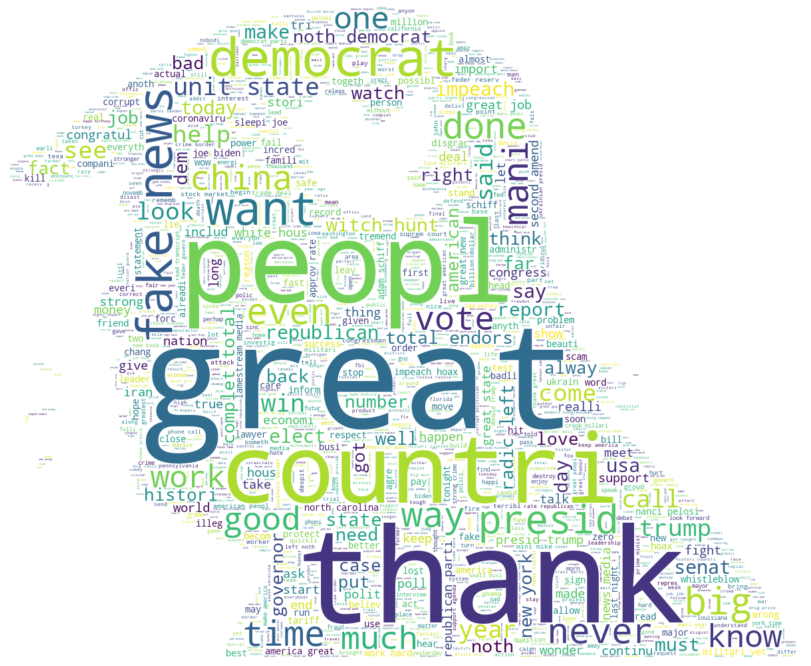

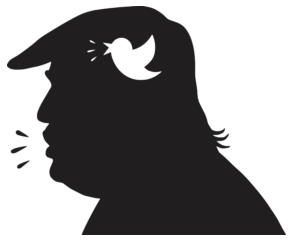

In [ ]:
# Word cloud of Trump's tweets:
column = "clean_text"
pic = "./trump_pic.jpg" 
rcParams['figure.figsize'] = 5, 5
word_cloud(df=trump_df, column=column, max_words = 2000, pic_path = pic)

###Trump Retweets

In [ ]:
# Load trump retweets:
df = pd.read_csv("trump_retweets.csv", low_memory=False)

In [ ]:
sf = tc.SFrame(df.replace({pd.np.nan: None}))
sf.save('drive/My Drive/big_data/trump_retweets.sframe')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



In [ ]:
# Data Preprocessing:
specific_columns = ['created_at','id','source','text','in_reply_to_status_id','in_reply_to_user_id','user.id','State_abbv']
preprocessed_df = preprocessing(df=df, specific_columns = specific_columns)

Start Preprocessing
filter unknown sources
remove rows: 8510
Parse Date
Remove duplicates
After pre-proccessing DF shape is 2534751


In [ ]:
sf = tc.SFrame(preprocessed_df.replace({pd.np.nan: None}))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



In [ ]:
sf.save('drive/My Drive/big_data/trump_retweets_filter.sframe')

In [ ]:
# Clean text:
min_text_len = 1
preprocessed_df['clean_text'] = preprocessed_df['text'].apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len))

In [ ]:
preprocessed_df = preprocessed_df[~preprocessed_df['clean_text'].isna()]

In [ ]:
# Extract sentiment:
preprocessed_df['sentiment'] = preprocessed_df['clean_text'].apply(lambda x: get_sentiment(x))

In [ ]:
sf = tc.SFrame(preprocessed_df.replace({pd.np.nan: None}))
sf.save('drive/My Drive/big_data/trump_retweets_preproccesing.sframe')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



In [ ]:
preprocessed_df = tc.SFrame('drive/My Drive/big_data/trump_retweets_preproccesing.sframe')
preprocessed_df = preprocessed_df.to_dataframe()

###Analysis between Trump's Tweets and the replies tweets

In [ ]:
# Filter for trump retweets and replies:
trump_user_id = 25073877
trump_replies_df = preprocessed_df[preprocessed_df['in_reply_to_user_id']==f'{trump_user_id}.0'].reset_index(drop=True)
trump_replies_df['date'] = trump_replies_df['date'].apply(lambda d: d.date())
trump_replies_df_agg = trump_replies_df.groupby(['date']).mean().reset_index()

In [ ]:
trump_replies_df_agg.head(5)

,date,id,in_reply_to_status_id,user.id,sentiment
0,2019-06-01,1.134772e+18,1.134399e+18,3.350786e+17,0.035076
1,2019-06-02,1.135131e+18,1.132973e+18,3.326256e+17,0.016940
2,2019-06-03,1.135494e+18,1.133365e+18,3.163551e+17,0.030928
3,2019-06-04,1.135802e+18,1.129751e+18,3.436438e+17,0.036966
4,2019-06-05,1.136200e+18,1.132354e+18,3.377880e+17,0.048855


In [ ]:
# Filter per dates:
min_date = min(trump_df['created_at'])
trump_replies_df = trump_replies_df[trump_replies_df['date']>=min_date]

In [ ]:
# Create sentiment over time graph:
id_list = list(set(trump_df['status_id']))
trump_replies_df['status_id'] = trump_replies_df['in_reply_to_status_id'].apply(lambda x: find_status_id(id=x, id_list=id_list))

In [ ]:
print(f'After filtering the match between Trump\'s tweet and his reactions, {len(trump_replies_df[~trump_replies_df["status_id"].isna()])} lines were found')

After filtering the match between Trump's tweet and his reactions, 714622 lines were found


In [ ]:
trump_replies_sentiment_gb = trump_replies_df[['status_id','sentiment']].groupby(by='status_id').mean().reset_index()
trump_replies_sentiment_gb = trump_replies_sentiment_gb.rename(columns={'sentiment':'mean_replies_sentiment'})
trump_replies_sentiment_gb = trump_replies_sentiment_gb.dropna()

In [ ]:
# Merge with trump tweets:
new_trump_replies_df = trump_df.merge(trump_replies_sentiment_gb, on='status_id', how='left')
assert new_trump_replies_df['mean_replies_sentiment'].dropna().shape[0]==trump_replies_sentiment_gb.shape[0]

In [ ]:
new_trump_replies_df = new_trump_replies_df[['created_at','status_id','covid_tweet','sentiment','subjectivity','mean_replies_sentiment', 'replies']]

In [ ]:
# new_trump_replies_df.to_csv('drive/My Drive/big_data/trump_retweet_maches.csv',index=False)
# new_trump_replies_df = pd.read_csv('drive/My Drive/big_data/trump_retweet_maches.csv')

In [ ]:
covid_spread_state_gb = covid_spread_state_df.groupby(by='date').sum().reset_index()
new_trump_replies_df['date_str'] = new_trump_replies_df['created_at'].astype(str)

In [ ]:
new_trump_replies_df = new_trump_replies_df.merge(covid_spread_state_gb, left_on='date_str', right_on='date', how='left')

In [ ]:
new_trump_replies_df['covid cases'] = new_trump_replies_df['covid cases'].fillna(value=0)
new_trump_replies_df['covid deaths'] = new_trump_replies_df['covid deaths'].fillna(value=0)

###**Graph** Sentiment and Covid Cases

In [ ]:
all_data_df = new_trump_replies_df.groupby(by='created_at')[['sentiment','mean_replies_sentiment','subjectivity','covid cases','covid deaths', 'replies']].mean().reset_index()

In [ ]:
# all_data_df['mean_replies_sentiment'].dropna()
all_data_df.tail(5)

,created_at,sentiment,mean_replies_sentiment,subjectivity,covid cases,covid deaths,replies
400,2020-07-14,0.104167,0.030043,0.243750,65459.0,952.0,36439.000000
401,2020-07-15,0.280957,0.035560,0.389481,68085.0,969.0,22690.333333
402,2020-07-16,0.217708,0.055006,0.348958,75486.0,957.0,17063.000000
403,2020-07-17,0.108333,0.033055,0.339569,70357.0,896.0,21399.714286
404,2020-07-18,0.245238,0.007008,0.595238,62106.0,774.0,48394.666667


In [ ]:
# Create some mock data
t = all_data_df['created_at']
cases = all_data_df['covid cases']
avg = all_data_df['mean_replies_sentiment'].dropna().mean()
comment_sentiment = all_data_df['mean_replies_sentiment'].fillna(avg)
trump_sentiment = all_data_df['sentiment'] 
# subjectivity = all_data_df['subjectivity'] 

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(comment_sentiment,21,5), name="trump comments sentiment", line=dict(color='royalblue', width=2, dash='dot') ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(trump_sentiment,51,3), name="trump tweets sentiment", line=dict(color='green', width=2, dash='dot')),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(cases,11,3), name="cases", line=dict(color='red', width=2)),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Trump Sentiment VS COVID-19 Cases"
)
# Set x-axis title
fig.update_xaxes(title_text="Day")
# Set y-axes titles
fig.update_yaxes(title_text="<b>Trump Score</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Cases</b>", secondary_y=True)
fig.show()

###HeatMap

#####General Corr HeatMap

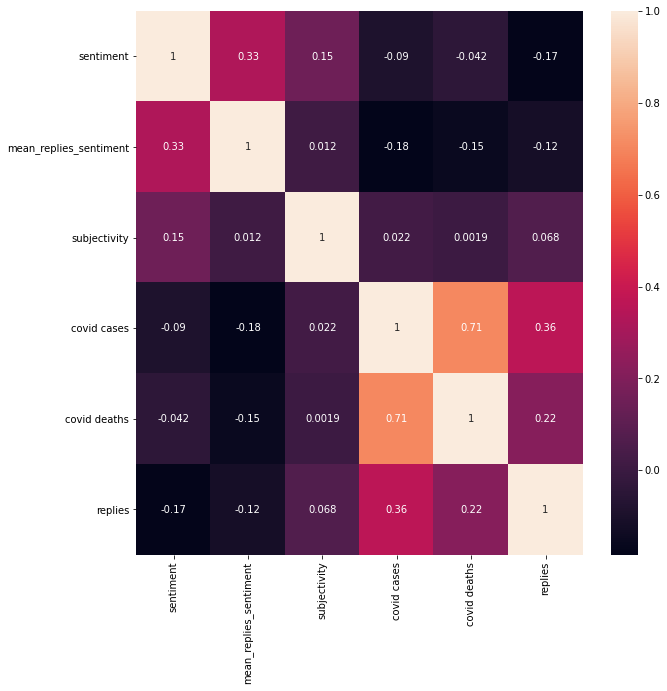

In [ ]:

# heatmap

from pylab import rcParams
rcParams['figure.figsize'] = 10, 10
a = all_data_df[['sentiment', 'mean_replies_sentiment', 'subjectivity','covid cases','covid deaths','replies' ]].corr()
sns.heatmap(a, xticklabels=a.columns, yticklabels=a.columns, annot=True)  
plt.show()

#####Covid Time Corr HeatMap

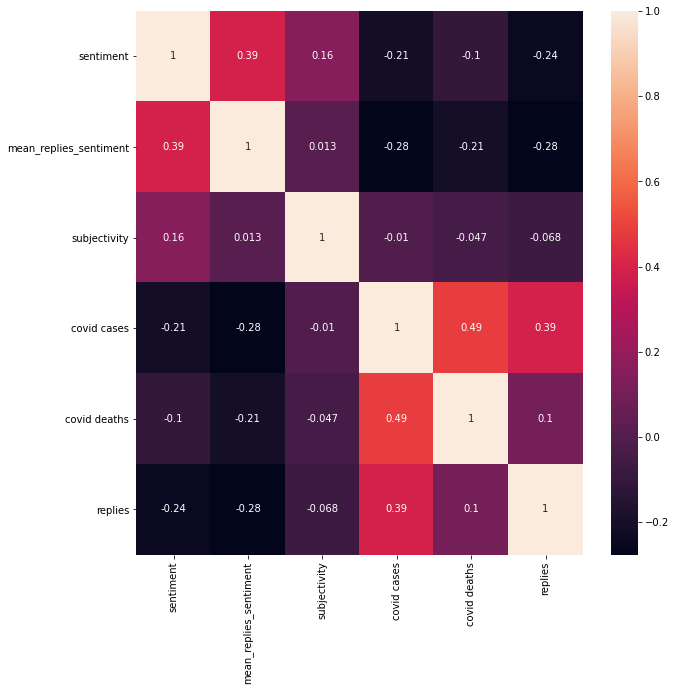

In [ ]:
covid_time_trump_agg = all_data_df[all_data_df['created_at']>pd.to_datetime('20200201',format='%Y%m%d')]
a = covid_time_trump_agg[['sentiment', 'mean_replies_sentiment', 'subjectivity','covid cases','covid deaths','replies']].corr()
sns.heatmap(a, xticklabels=a.columns, yticklabels=a.columns, annot=True)  
plt.show()

##Biden tweets

####Biden Tweets

In [ ]:
# Load Biden tweets:
biden_path ='./drive/My Drive/Colab Notebooks/Big Data/final_project/Data/other/twitts (1)/JoeBiden (1).csv'
biden_df = pd.read_csv(biden_path)
biden_df

,date,username,to,replies,retweets,favorites,text,geo,mentions,hashtags,id,permalink
0,2020-07-18 14:58:00,JoeBiden,NaN,3498,34989,155112,"I know of no man with more courage than John Lewis. He was a giant walking among us. When I saw him, I couldn’t help but think one thing: “I haven’t done enough.” May his life and legacy inspire e...",NaN,NaN,NaN,1284502687430479874,https://twitter.com/JoeBiden/status/1284502687430479874
1,2020-07-18 14:15:58,JoeBiden,NaN,890,8789,42115,My full statement:,NaN,NaN,NaN,1284492110503317504,https://twitter.com/JoeBiden/status/1284492110503317504
2,2020-07-18 14:15:58,JoeBiden,NaN,3385,27309,171686,"We are made in the image of God, and then there is John Lewis. He was truly one-of-a-kind, a moral compass who always knew where to point us and which direction to march. To John’s family, friends...",NaN,NaN,NaN,1284492109496619009,https://twitter.com/JoeBiden/status/1284492109496619009
3,2020-07-18 00:00:00,JoeBiden,NaN,3688,8282,36827,"As President, I will see to it that America once again stands for human rights. That doesn't mean rights only for some, but rights for all — each and every American, and every person, everywhere. ...",NaN,NaN,NaN,1284276699337646080,https://twitter.com/JoeBiden/status/1284276699337646080
4,2020-07-17 22:50:00,JoeBiden,AP,777,4161,21043,"Today, we lost a giant of the civil rights movement and a relentless champion in the struggle for justice. Reverend C.T. Vivian never stopped pushing our nation closer to our highest ideals — and ...",NaN,NaN,NaN,1284259082254217216,https://twitter.com/JoeBiden/status/1284259082254217216
...,...,...,...,...,...,...,...,...,...,...,...,...
3263,2019-06-11 17:55:40,JoeBiden,NaN,67,101,328,"When it comes to President Trump’s tariff war with China, one thing is clear: America’s farmers and manufacturers are getting crushed – no one knows that better than Iowa. To Trump, the people get...",NaN,NaN,#TeamJoe,1138505090275389442,https://twitter.com/JoeBiden/status/1138505090275389442
3264,2019-06-11 17:51:38,JoeBiden,NaN,319,249,2114,"Hey everyone, @TeamJoe here. We’re taking over to keep you in the loop on our event in Ottumwa, Iowa. Stay tuned! #TeamJoe",NaN,@TeamJoe,#TeamJoe,1138504076788936706,https://twitter.com/JoeBiden/status/1138504076788936706
3265,2019-06-10 22:46:00,JoeBiden,NaN,428,342,1879,I'm headed to eastern Iowa this week to talk with voters about our vision for the future. Head to http://JoeBiden.com/Events to RSVP to an event in your community.,NaN,NaN,NaN,1138215765843283969,https://twitter.com/JoeBiden/status/1138215765843283969
3266,2019-06-10 18:10:00,JoeBiden,NaN,155,233,1573,It was great to be back in Atlanta! Thank you to Mayor @KeishaBottoms for showing me around town and for your work expanding opportunity to every corner of the city.,NaN,@KeishaBottoms,NaN,1138146307921465346,https://twitter.com/JoeBiden/status/1138146307921465346


In [ ]:
# Data preprocessing:
biden_df = biden_df.rename(columns={'date': 'created_at'})
biden_df['created_at'] = biden_df['created_at'].apply(lambda x: convertDate(str(x)))
biden_df = biden_df.sort_values("created_at")
biden_df = biden_df.dropna(subset=['created_at','id','text'])
biden_df['status_id'] = biden_df['permalink'].apply(lambda x: x.split('/')[-1])

In [ ]:
# Tag corona tweets:
biden_df['covid_tweet'] = biden_df['text'].apply(lambda x: is_relevent_tweet(text=x,words_list=corona_keyword))

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
biden_df['clean_text'] = biden_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len, min_word_len=min_word_len, stem=True))
biden_df['clean_text_no_stem'] = biden_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len, min_word_len=min_word_len, stem=False))
biden_df = biden_df[~biden_df['clean_text'].isna()]






  0%|          | 0/3267 [00:00<?, ?it/s]




  3%|▎         | 99/3267 [00:00<00:03, 987.32it/s]




  6%|▌         | 200/3267 [00:00<00:03, 991.29it/s]




  9%|▉         | 306/3267 [00:00<00:02, 1010.48it/s]




 13%|█▎        | 426/3267 [00:00<00:02, 1060.04it/s]




 17%|█▋        | 550/3267 [00:00<00:02, 1107.80it/s]




 21%|██        | 672/3267 [00:00<00:02, 1138.47it/s]




 24%|██▍       | 799/3267 [00:00<00:02, 1172.23it/s]




 28%|██▊       | 924/3267 [00:00<00:01, 1194.50it/s]




 32%|███▏      | 1049/3267 [00:00<00:01, 1203.61it/s]




 36%|███▌      | 1172/3267 [00:01<00:01, 1210.67it/s]




 40%|███▉      | 1303/3267 [00:01<00:01, 1237.88it/s]




 44%|████▍     | 1436/3267 [00:01<00:01, 1263.44it/s]




 48%|████▊     | 1562/3267 [00:01<00:01, 1252.44it/s]




 52%|█████▏    | 1687/3267 [00:01<00:01, 1241.26it/s]




 55%|█████▌    | 1811/3267 [00:01<00:01, 1192.15it/s]




 59%|█████▉    | 1931/3267 [00:01<00:01, 1189.48it/s]




 63%|██████▎   | 2066/3267 [00:01

In [ ]:
# Extract sentiment:
biden_df['sentiment'] = biden_df['clean_text'].apply(lambda x: get_sentiment(x))  
biden_df['sentiment_desc'] = biden_df['sentiment'].apply(lambda x: sentiment_recognize(x))

In [ ]:

biden_df['subjectivity'] = biden_df['clean_text'].apply(lambda t: get_subjectivity(t))

In [ ]:
# Create pie of trump tweet sentiment:
import plotly.express as px
counts = Counter(biden_df['sentiment_desc'])
fig = px.pie( values=[float(v) for v in counts.values()], names=[k for k in counts]
                                  ,title='biden\'s tweets sentiment description')
fig.show()

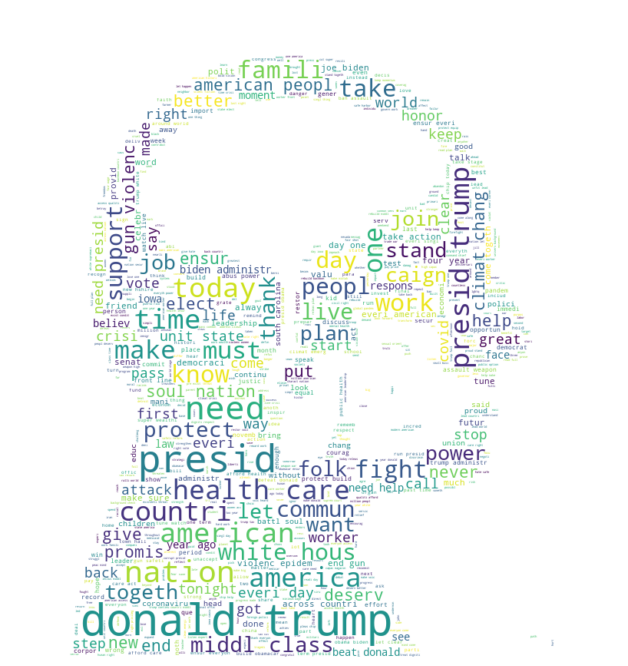

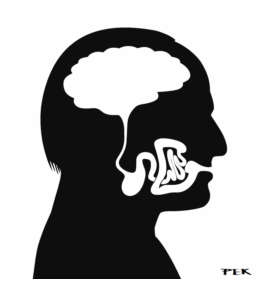

In [ ]:
# Word cloud of Trump's tweets:
column = "clean_text"
pic = "./asdf.png" 
rcParams['figure.figsize'] = 5, 5
word_cloud(df=biden_df, column=column, max_words = 4000, pic_path = pic)

###Biden Retweets

In [ ]:
# Load Biden retweets:
df = pd.read_csv("/content/drive/My Drive/big_data/tables/biden_retweets.csv", low_memory=False) 
df

,created_at,id,text,source,in_reply_to_status_id,in_reply_to_user_id,user.id,State_abbv,date,hour,date_and_hour,folder
0,20200718T180909,1.284505e+18,@ArletteSaenz @maggieNYT @JoeBiden @DrBiden So...,"<a href=""""http://twitter.com/download/iphone""""...",1.284494e+18,21878635.0,1.951878e+08,MD,20200718T000000,18.0,2020-07-18 18.0,Data/BGU DATA/Leaders Tweets and Retweets/
1,20200630T012300,1.277729e+18,@JoeBiden You're a disgrace,"<a href=""""http://twitter.com/download/android""...",1.277399e+18,939091.0,8.941870e+17,MA,20200630T000000,1.0,2020-06-30 1,Data/BGU DATA/Leaders Tweets and Retweets/
2,20200705T130604,1.279718e+18,@mcuban @JustinMRhoades @kanyewest @JoeBiden @...,"<a href=""""http://twitter.com/download/iphone""""...",1.279621e+18,16228398.0,8.479375e+17,MO,20200705T000000,13.0,2020-07-05 13,Data/BGU DATA/Leaders Tweets and Retweets/
3,20200621T135443,1.274657e+18,@bradmueller @SuzanneLindahl @iArvindKushwaha ...,"<a href=""""http://twitter.com/download/iphone""""...",1.274602e+18,1062395881.0,1.241466e+18,OR,20200621T000000,13.0,2020-06-21 13,Data/BGU DATA/Leaders Tweets and Retweets/
4,20200704T140844,1.279372e+18,"@JoeBiden \nNow, more than ever, we need a Pre...","<a href=""""http://twitter.com/download/iphone""""...",NaN,939091,1.081908e+18,NC,20200704T000000,14.0,2020-07-04 14,Data/BGU DATA/Leaders Tweets and Retweets/
...,...,...,...,...,...,...,...,...,...,...,...,...
295607,20200527T114735,1.265565e+18,@GeraldoRivera @Twitter @realDonaldTrump @JoeB...,"<a href=""""http://twitter.com/download/android""...",1.265565e+18,7.601756111973376e+17,7.601756e+17,AR,20200527T000000,11.0,2020-05-27 11,Data/BGU DATA/Leaders Tweets and Retweets/
295608,20200527T073405,1.265502e+18,@JoeBiden Absolutely !\nYou have my vote and ...,"<a href=""""http://twitter.com/download/iphone""""...",1.265327e+18,939091.0,5.064492e+07,MO,20200527T000000,7.0,2020-05-27 7,Data/BGU DATA/Leaders Tweets and Retweets/
295609,20200115T215655,1.217536e+18,@CTGOPChair @realDonaldTrump He's literally in...,"<a href=""""https://mobile.twitter.com"""" rel=""""n...",1.217515e+18,9.643242458777724e+17,9.253499e+17,VA,20200115T000000,21.0,2020-01-15 21,Data/BGU DATA/Leaders Tweets and Retweets/
295610,20190930T065903,1.178520e+18,@JoeBiden @JoeBiden u shook the American Peopl...,"<a href=""""https://mobile.twitter.com"""" rel=""""n...",1.178471e+18,939091.0,4.302802e+09,OK,20190930T000000,6.0,2019-09-30 6,Data/BGU DATA/Leaders Tweets and Retweets/


In [ ]:
sf = tc.SFrame(df.replace({pd.np.nan: None}))
sf.save('drive/My Drive/big_data/biden_retweets.sframe')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



In [ ]:
# Data Preprocessing:
specific_columns = ['created_at','id','source','text','in_reply_to_status_id','in_reply_to_user_id','user.id','State_abbv']
preprocessed_df = preprocessing(df=df, specific_columns = specific_columns)

Start Preprocessing
filter unknown sources
remove rows: 1218
Parse Date
Remove duplicates
After pre-proccessing DF shape is 294357


In [ ]:
# Clean text:
min_text_len = 1
preprocessed_df['clean_text'] = preprocessed_df['text'].apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len))

In [ ]:
preprocessed_df = preprocessed_df[~preprocessed_df['clean_text'].isna()]

In [ ]:
# Extract sentiment:
preprocessed_df['sentiment'] = preprocessed_df['clean_text'].apply(lambda x: get_sentiment(x))

###Analysis between Biden's Tweets and the replies tweets

In [ ]:
# Filter for trump retweets and replies:
biden_user_id = 939091
biden_replies_df = preprocessed_df[preprocessed_df['in_reply_to_user_id']==f'{biden_user_id}.0'].reset_index(drop=True)
# biden_replies_df['date'] = biden_replies_df['date'].apply(lambda d: d.date())
biden_replies_df_agg = biden_replies_df.groupby(['date']).mean().reset_index()

In [ ]:
biden_replies_df_agg.head(5)

,date,id,in_reply_to_status_id,user.id,sentiment
0,2019-07-21,1.152888e+18,1.151248e+18,2.676526e+17,0.050378
1,2019-07-22,1.153239e+18,1.151327e+18,2.907205e+17,0.056595
2,2019-07-23,1.153543e+18,1.141953e+18,2.075672e+17,-0.004242
3,2019-07-24,1.153918e+18,1.146263e+18,2.931357e+17,0.009691
4,2019-07-25,1.154298e+18,1.148109e+18,1.396625e+17,0.061667


In [ ]:
# Filter per dates:
min_date = min(biden_df['created_at'])
biden_replies_df = biden_replies_df[biden_replies_df['date']>=min_date]

In [ ]:
# Create sentiment over time graph:
id_list = list(set(biden_df['status_id']))
biden_replies_df['status_id'] = biden_replies_df['in_reply_to_status_id'].apply(lambda x: find_status_id(id=x, id_list=id_list))

In [ ]:
print(f'After filtering the match between Biden\'s tweet and his reactions, {len(biden_replies_df[~biden_replies_df["status_id"].isna()])} lines were found')

After filtering the match between Biden's tweet and his reactions, 62238 lines were found


In [ ]:
biden_replies_sentiment_gb = biden_replies_df[['status_id','sentiment']].groupby(by='status_id').mean().reset_index()
biden_replies_sentiment_gb = biden_replies_sentiment_gb.rename(columns={'sentiment':'mean_replies_sentiment'})
biden_replies_sentiment_gb = biden_replies_sentiment_gb.dropna()

In [ ]:
# Merge with trump tweets:
new_biden_replies_df = biden_df.merge(biden_replies_sentiment_gb, on='status_id', how='left')
assert new_biden_replies_df['mean_replies_sentiment'].dropna().shape[0]==biden_replies_sentiment_gb.shape[0]

In [ ]:
new_biden_replies_df = new_biden_replies_df[['created_at','status_id','covid_tweet','sentiment','subjectivity','mean_replies_sentiment', 'replies']]

In [ ]:
covid_spread_state_gb = covid_spread_state_df.groupby(by='date').sum().reset_index()
new_biden_replies_df['date_str'] = new_biden_replies_df['created_at'].astype(str)

In [ ]:
new_biden_replies_df = new_biden_replies_df.merge(covid_spread_state_gb, left_on='date_str', right_on='date', how='left')

In [ ]:
new_biden_replies_df['covid cases'] = new_biden_replies_df['covid cases'].fillna(value=0)
new_biden_replies_df['covid deaths'] = new_biden_replies_df['covid deaths'].fillna(value=0)

###**Graph** sentiments and Covid Cases

In [ ]:
all_data_biden_df = new_biden_replies_df.groupby(by='created_at')[['sentiment','mean_replies_sentiment','subjectivity','covid cases','covid deaths', 'replies']].mean().reset_index()

In [ ]:
# all_data_df['mean_replies_sentiment'].dropna()
all_data_biden_df.tail(5)

,created_at,sentiment,mean_replies_sentiment,subjectivity,covid cases,covid deaths,replies
400,2020-07-14,0.164218,0.069397,0.416224,65459.0,952.0,4997.714286
401,2020-07-15,0.253053,0.055084,0.436673,68085.0,969.0,3607.333333
402,2020-07-16,-0.116429,0.006025,0.320238,75486.0,957.0,3788.600000
403,2020-07-17,0.107729,0.042465,0.269891,70357.0,896.0,8833.750000
404,2020-07-18,0.203051,0.045349,0.514509,62106.0,774.0,2865.250000


In [ ]:
# Create some mock data
t = all_data_biden_df['created_at']
cases = all_data_biden_df['covid cases']
avg = all_data_biden_df['mean_replies_sentiment'].dropna().mean()
comment_sentiment = all_data_biden_df['mean_replies_sentiment'].fillna(avg)
biden_sentiment = all_data_biden_df['sentiment'] 

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(comment_sentiment,21,5), name="Biden comments sentiment", line=dict(color='royalblue', width=2, dash='dot') ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(biden_sentiment,51,3), name="Biden tweets sentiment", line=dict(color='green', width=2, dash='dot')),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=t, y=savgol_filter(cases,11,3), name="cases", line=dict(color='red', width=2)),
    secondary_y=True,
)

# Add figure title
fig.update_layout(
    title_text="Biden Sentiment VS COVID-19 Cases"
)
# Set x-axis title
fig.update_xaxes(title_text="Day")
# Set y-axes titles
fig.update_yaxes(title_text="<b>Biden Score</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Cases</b>", secondary_y=True)
fig.show()

###**HeatMap**

Sentiment | Mean Replies Sentiment | Subjectivity | Covid Cases | Covid Deaths Replies

#####General Corr HeatMap

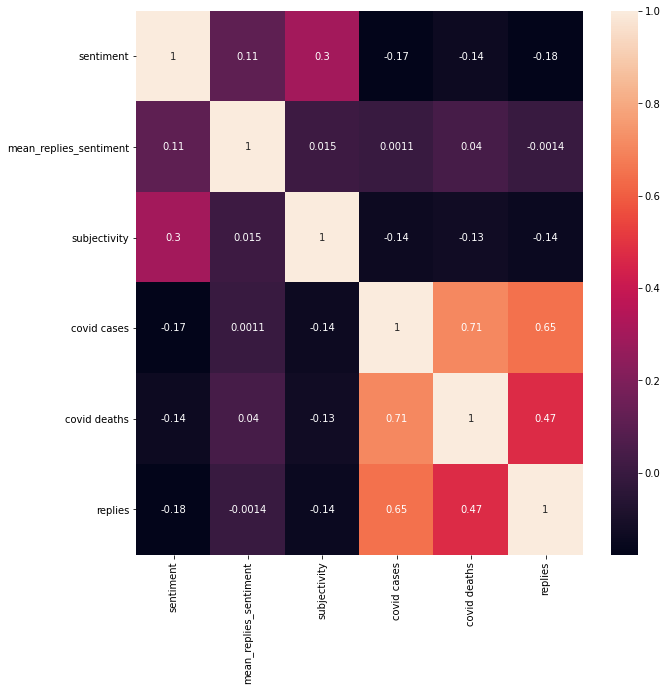

In [ ]:
# heatmap
from pylab import rcParams
rcParams['figure.figsize'] = 10, 10
a = all_data_biden_df[['sentiment', 'mean_replies_sentiment', 'subjectivity','covid cases','covid deaths','replies' ]].corr()
sns.heatmap(a, xticklabels=a.columns, yticklabels=a.columns, annot=True)  
plt.show()

#####Covid Time Corr HeatMap

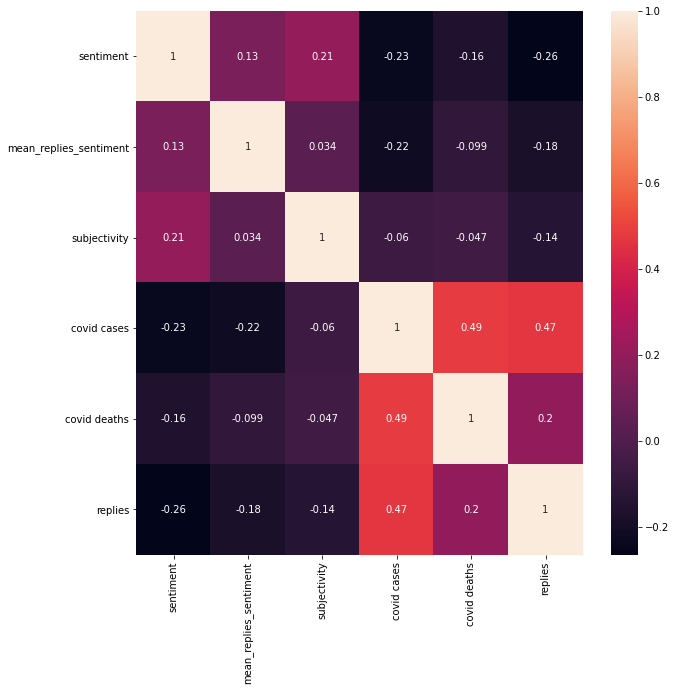

In [ ]:
covid_time_biden_agg = all_data_biden_df[all_data_biden_df['created_at']>pd.to_datetime('20200201',format='%Y%m%d')]
a = covid_time_biden_agg[['sentiment', 'mean_replies_sentiment', 'subjectivity','covid cases','covid deaths','replies']].corr()
sns.heatmap(a, xticklabels=a.columns, yticklabels=a.columns, annot=True)  
plt.show()

# Analysis of Stocks Tweets

In [ ]:
stock_prices_df = pd.read_csv('/content/drive/My Drive/big_data/tables/stocks_prices.csv', index_col='Unnamed: 0')
stock_prices_df['Date'] = stock_prices_df['Date'].apply(lambda x: pd.to_datetime(x, format='%Y-%m-%d'))
stock_prices_df

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,stock,sector
0,2019-06-03,25.60,26.07,25.60,26.00,90400.0,0.0,0.0,TAN,Solar Energy
1,2019-06-04,25.98,26.31,25.92,26.22,255200.0,0.0,0.0,TAN,Solar Energy
2,2019-06-05,26.56,26.74,26.32,26.74,348600.0,0.0,0.0,TAN,Solar Energy
3,2019-06-06,26.48,26.64,26.22,26.56,91200.0,0.0,0.0,TAN,Solar Energy
4,2019-06-07,26.71,27.15,26.66,26.93,529100.0,0.0,0.0,TAN,Solar Energy
...,...,...,...,...,...,...,...,...,...,...
2297,2020-07-13,40.35,40.72,39.47,40.10,370715.0,0.0,0.0,CL=F,Crude
2298,2020-07-14,39.60,40.57,39.07,40.29,426971.0,0.0,0.0,CL=F,Crude
2299,2020-07-15,40.55,41.26,40.08,41.20,352542.0,0.0,0.0,CL=F,Crude
2300,2020-07-16,40.97,41.18,40.52,40.75,200101.0,0.0,0.0,CL=F,Crude


In [ ]:
# Load data:
input_url = "/content/drive/My Drive/big_data/tables/stock_tweets.csv"
stocks_df = pd.read_csv(input_url, low_memory=False)
print(stocks_df.shape)

(694232, 13)


In [ ]:
# Config:
market_relavant_words = ['s&p','nasda','vix','stock market','energy stock', 'es_f','sp5', 'S&amp;P' 'ixic']
clean_energy_relevant_words = ['nee','nextera','tsla', 'tesla','pbw','invesco wilderhill','clean energy','cleanenergy','clean_energy', 'elon musk', 'elonmask', 'elon_mask']
Crude_relevant_words = ['uco', 'bno','clf','cl=f','cl_f','black oil','blackoil','black_oil','crude','wti', 'brent','dbo','oott', 'oil trading', 'oil_trading','oiltrading','fintwit','oil price','oilprice','oil_price','usa oil', 'usoil', 'usaoil']
Solar_Energy_relevant_words = ['tan','solar']
Gasoline_relevant_word = ['gasoline','gas','uga']
dict_stock_sector  = {'Solar Energy': ['TAN'], 'Clean Energy': ['NEE', 'TSLA', 'PBW'], 'Crude': ['UCO','BNO','CL=F'], 'Gasoline': ['UGA']}

In [ ]:
stocks_df['text'] = stocks_df['text'].astype(str)
stocks_df['source'] = stocks_df['source'].astype(str)
stocks_df['created_at'] = stocks_df['created_at'].astype(str)

In [ ]:
# Data preprocessing:
stocks_df = stocks_df[~stocks_df['text'].str.lower().str.contains("toilet")]
cols = ['created_at','id','source', 'text','in_reply_to_status_id','in_reply_to_user_id','user.id','State_abbv']
stocks_df = preprocessing(stocks_df, specific_columns = cols)
stocks_df['sector'] = stocks_df['text'].progress_apply(lambda x: recognize_sector(x, market_relavant_words, clean_energy_relevant_words, Crude_relevant_words, Solar_Energy_relevant_words, Gasoline_relevant_word)) 
stocks_df = stocks_df[stocks_df['sector'].isin(['Clean Energy','Crude','Gasoline','Solar Energy'])]

Start Preprocessing
filter unknown sources


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:153: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



remove rows: 18469
Parse Date
Remove duplicates


  1%|          | 7607/675318 [00:00<00:08, 76066.81it/s]

After pre-proccessing DF shape is 675318


100%|██████████| 675318/675318 [00:07<00:00, 94878.97it/s]


In [ ]:
stocks_df.shape[0]

73480

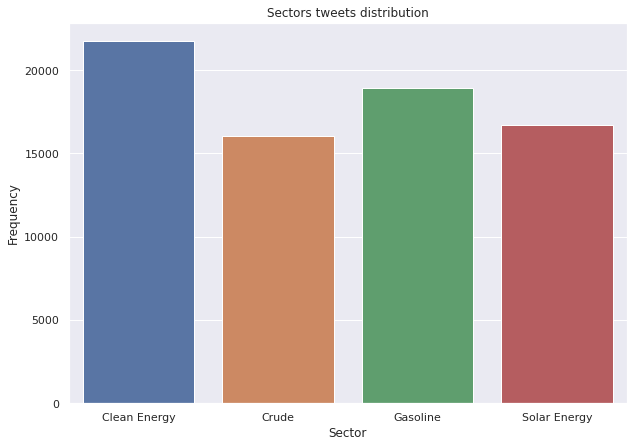

In [ ]:
# Sector tweets distribution:
stocks_gb = stocks_df.groupby('sector').count()['id'].reset_index()
sns.barplot(stocks_gb['sector'],stocks_gb['id'])
sns.set(rc={'figure.figsize':(10,10)})
plt.xlabel("Sector")
plt.ylabel("Frequency")
plt.title("Sectors tweets distribution")
plt.show()

## Clean Energy

In [ ]:
# Filter tweets per sector:
clean_energy_df = stocks_df[stocks_df['sector']=='Clean Energy']

In [ ]:
# Load data:
clean_energy_prices = stock_prices_df[stock_prices_df['sector']=='Clean Energy']

In [ ]:
# Plot stock prices:
for stock in dict_stock_sector['Clean Energy']:
  plot_stock(df=clean_energy_prices, stock=stock)

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
clean_energy_df['clean_text'] = clean_energy_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,
                                                                                                  min_word_len=min_word_len, remove_hashtag=True))
clean_energy_df = clean_energy_df[~clean_energy_df['clean_text'].isna()]

100%|██████████| 21754/21754 [00:13<00:00, 1582.69it/s]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Extract sentiment:
clean_energy_df['sentiment'] = clean_energy_df['clean_text'].progress_apply(lambda x: get_sentiment(x))

100%|██████████| 21625/21625 [00:11<00:00, 1947.84it/s]


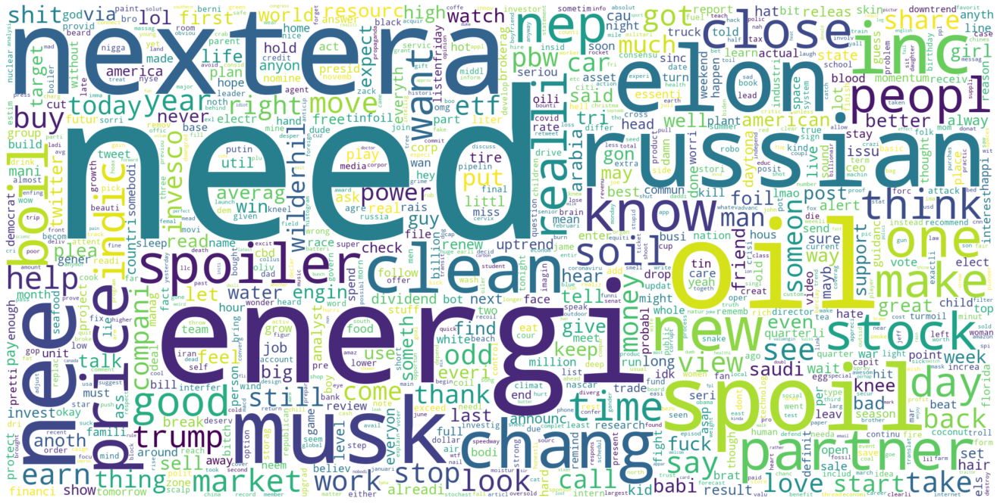

<Figure size 720x504 with 0 Axes>

In [ ]:
# Create word cloud:
word_cloud(clean_energy_df, column='clean_text', max_words = 1000)

We chose to present the PBW ETF because it best represents the sector versus the sentiment of the tweets

In [ ]:
# Plot stock prices and daily sector sentiment:
stock = 'PBW'
clean_energy_prices_stock = clean_energy_prices[clean_energy_prices['stock']==stock]
clean_energy_gb = clean_energy_df.groupby(by=['date']).mean()['sentiment'].reset_index()
clean_energy_prices_gb = clean_energy_prices_stock.groupby(by=['Date']).mean()[['Open','High','Low','Close']].reset_index()
clean_energy_prices_gb['Date'] = clean_energy_prices_gb['Date'].astype(str)
clean_energy_gb['date'] = clean_energy_gb['date'].astype(str)
clean_energy_stock = clean_energy_gb.merge(clean_energy_prices_gb, how='inner', right_on='Date', left_on='date')
plot_stock_sentiment(stock_gb=clean_energy_stock)

## Solar Energy

In [ ]:
# Filter tweets per sector:
solar_energy_df = stocks_df[stocks_df['sector']=='Solar Energy']

In [ ]:
# Load data:
solar_energy_prices = stock_prices_df[stock_prices_df['sector']=='Solar Energy']

In [ ]:
# Plot stock prices:
for stock in dict_stock_sector['Solar Energy']:
  plot_stock(df=solar_energy_prices, stock=stock)

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
solar_energy_df['clean_text'] = solar_energy_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,
                                                                                                  min_word_len=min_word_len, remove_hashtag=True))
solar_energy_df = solar_energy_df[~solar_energy_df['clean_text'].isna()]

100%|██████████| 16717/16717 [00:10<00:00, 1615.55it/s]
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Extract sentiment:
solar_energy_df['sentiment'] = solar_energy_df['clean_text'].progress_apply(lambda x: get_sentiment(x))

100%|██████████| 16159/16159 [00:08<00:00, 1969.81it/s]


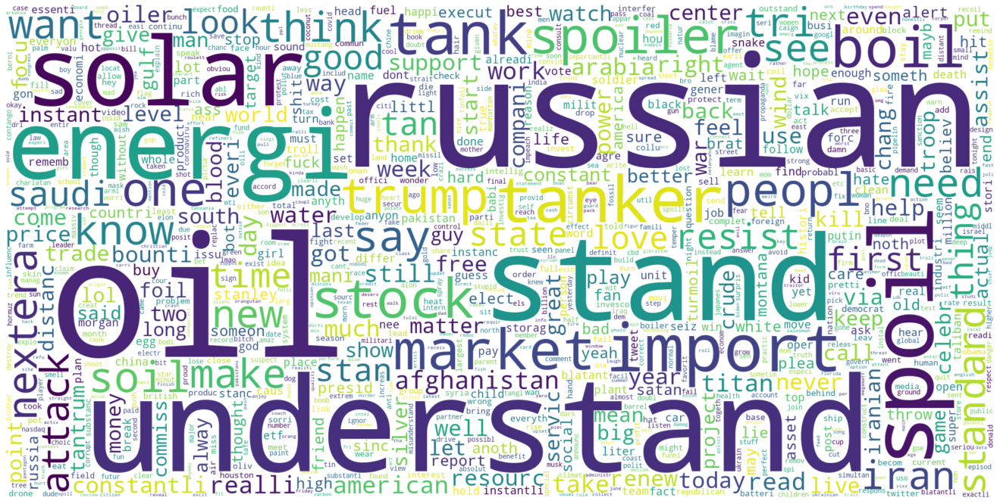

<Figure size 720x504 with 0 Axes>

In [ ]:
# Create word cloud:
word_cloud(solar_energy_df, column='clean_text', max_words = 1000)

In [ ]:
# Plot stock prices and daily sector sentiment:
stock = 'TAN'
solar_energy_prices_stock = solar_energy_prices[solar_energy_prices['stock']==stock]
solar_energy_gb = solar_energy_df.groupby(by=['date']).mean()['sentiment'].reset_index()
solar_energy_prices_gb = solar_energy_prices_stock.groupby(by=['Date']).mean()[['Open','High','Low','Close']].reset_index()
solar_energy_gb['date'] = solar_energy_gb['date'].astype(str)
solar_energy_prices_gb['Date'] = solar_energy_prices_gb['Date'].astype(str)


solar_energy_stock = solar_energy_gb.merge(solar_energy_prices_gb, how='inner', right_on='Date', left_on='date')
plot_stock_sentiment(stock_gb=solar_energy_stock)
solar_energy_stock

,date,sentiment,Date,Open,High,Low,Close
0,2019-06-03,0.044100,2019-06-03,25.60,26.07,25.60,26.00
1,2019-06-04,0.014046,2019-06-04,25.98,26.31,25.92,26.22
2,2019-06-05,-0.011275,2019-06-05,26.56,26.74,26.32,26.74
3,2019-06-06,0.089120,2019-06-06,26.48,26.64,26.22,26.56
4,2019-06-07,0.007016,2019-06-07,26.71,27.15,26.66,26.93
...,...,...,...,...,...,...,...
278,2020-07-13,0.033383,2020-07-13,41.82,43.07,40.97,41.02
279,2020-07-14,0.091453,2020-07-14,40.73,43.05,40.31,43.01
280,2020-07-15,0.043727,2020-07-15,43.62,44.07,43.06,43.83
281,2020-07-16,0.072252,2020-07-16,43.26,43.42,42.61,42.88


## Crude

In [ ]:
# Filter tweets per sector:
crude_df = stocks_df[stocks_df['sector']=='Crude']

In [ ]:
# Load data:
crude_prices = stock_prices_df[stock_prices_df['sector']=='Crude']

In [ ]:
# Plot stock prices:
for stock in dict_stock_sector['Crude']:
  plot_stock(df=crude_prices, stock=stock)

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
crude_df['clean_text'] = crude_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,
                                                                                                  min_word_len=min_word_len, remove_hashtag=True))
crude_df = crude_df[~crude_df['clean_text'].isna()]






  0%|          | 0/16073 [00:00<?, ?it/s]




  1%|          | 184/16073 [00:00<00:08, 1837.70it/s]




  2%|▏         | 375/16073 [00:00<00:08, 1858.31it/s]




  3%|▎         | 548/16073 [00:00<00:08, 1816.74it/s]




  4%|▍         | 723/16073 [00:00<00:08, 1793.43it/s]




  6%|▌         | 897/16073 [00:00<00:08, 1774.73it/s]




  7%|▋         | 1075/16073 [00:00<00:08, 1774.70it/s]




  8%|▊         | 1249/16073 [00:00<00:08, 1763.40it/s]




  9%|▉         | 1418/16073 [00:00<00:08, 1738.46it/s]




 10%|▉         | 1603/16073 [00:00<00:08, 1768.91it/s]




 11%|█         | 1784/16073 [00:01<00:08, 1779.41it/s]




 12%|█▏        | 1957/16073 [00:01<00:08, 1761.39it/s]




 13%|█▎        | 2144/16073 [00:01<00:07, 1791.26it/s]




 15%|█▍        | 2334/16073 [00:01<00:07, 1820.93it/s]




 16%|█▌        | 2515/16073 [00:01<00:07, 1807.28it/s]




 17%|█▋        | 2696/16073 [00:01<00:07, 1806.18it/s]




 18%|█▊        | 2876/16073 [00:01<00:07, 1802.49it/s]




 19%|█▉   

In [ ]:
# Extract sentiment:
crude_df['sentiment'] = crude_df['clean_text'].progress_apply(lambda x: get_sentiment(x))






  0%|          | 0/15910 [00:00<?, ?it/s]




  1%|▏         | 226/15910 [00:00<00:06, 2252.03it/s]




  3%|▎         | 461/15910 [00:00<00:06, 2280.48it/s]




  4%|▍         | 690/15910 [00:00<00:06, 2281.64it/s]




  6%|▌         | 933/15910 [00:00<00:06, 2323.34it/s]




  7%|▋         | 1170/15910 [00:00<00:06, 2336.75it/s]




  9%|▊         | 1384/15910 [00:00<00:06, 2270.99it/s]




 10%|█         | 1606/15910 [00:00<00:06, 2255.33it/s]




 12%|█▏        | 1837/15910 [00:00<00:06, 2270.43it/s]




 13%|█▎        | 2080/15910 [00:00<00:05, 2313.31it/s]




 15%|█▍        | 2326/15910 [00:01<00:05, 2354.82it/s]




 16%|█▌        | 2561/15910 [00:01<00:05, 2352.05it/s]




 18%|█▊        | 2807/15910 [00:01<00:05, 2381.71it/s]




 19%|█▉        | 3043/15910 [00:01<00:05, 2361.55it/s]




 21%|██        | 3288/15910 [00:01<00:05, 2385.83it/s]




 22%|██▏       | 3526/15910 [00:01<00:05, 2281.68it/s]




 24%|██▎       | 3755/15910 [00:01<00:05, 2242.39it/s]




 25%|██▌ 

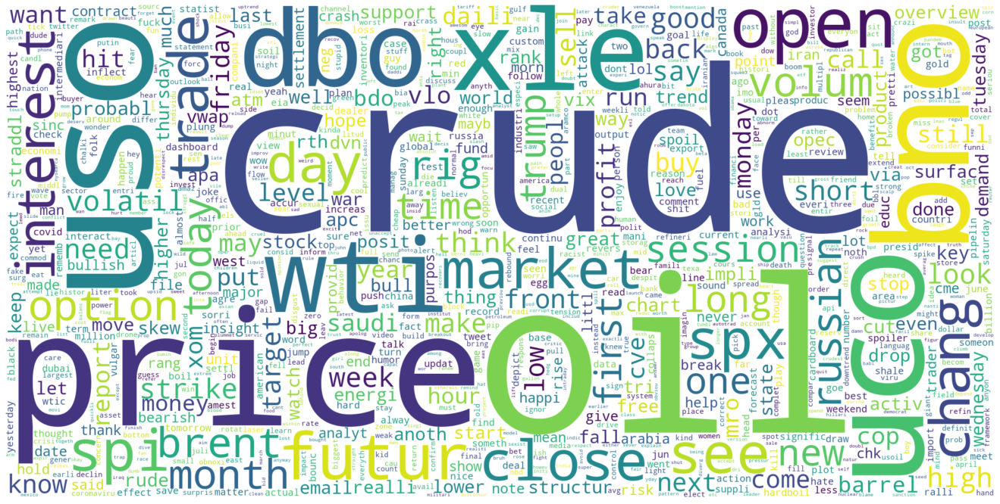

<Figure size 720x504 with 0 Axes>

In [ ]:
# Create word cloud:
word_cloud(crude_df, column='clean_text', max_words = 1000)

In [ ]:
# Plot stock prices and daily sector sentiment:
for stock in dict_stock_sector['Crude']:
  crude_prices_stock = crude_prices[crude_prices['stock']==stock]
  crude_gb = crude_df.groupby(by=['date']).mean()['sentiment'].reset_index()
  crude_prices_gb = crude_prices_stock.groupby(by=['Date']).mean()[['Open','High','Low','Close']].reset_index()

  crude_gb['date'] = crude_gb['date'].astype(str)
  crude_prices_gb['Date'] = crude_prices_gb['Date'].astype(str)


  crude_stock = crude_gb.merge(crude_prices_gb, how='inner', right_on='Date', left_on='date')
  plot_stock_sentiment(stock_gb=crude_stock)

## Gasoline

In [ ]:
# Filter tweets per sector:
gasoline_df = stocks_df[stocks_df['sector']=='Gasoline']

In [ ]:
# Load data:
gasoline_prices = stock_prices_df[stock_prices_df['sector']=='Gasoline']

In [ ]:
# Plot stock prices:
for stock in dict_stock_sector['Gasoline']:
  plot_stock(df=gasoline_prices, stock=stock)

In [ ]:
# Clean text:
min_text_len = 1
min_word_len = 3
gasoline_df['clean_text'] = gasoline_df['text'].progress_apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,
                                                                                                  min_word_len=min_word_len, remove_hashtag=True))
gasoline_df = gasoline_df[~gasoline_df['clean_text'].isna()]






  0%|          | 0/18936 [00:00<?, ?it/s]




  1%|          | 180/18936 [00:00<00:10, 1793.44it/s]




  2%|▏         | 357/18936 [00:00<00:10, 1785.01it/s]




  3%|▎         | 545/18936 [00:00<00:10, 1808.75it/s]




  4%|▍         | 722/18936 [00:00<00:10, 1796.81it/s]




  5%|▍         | 904/18936 [00:00<00:10, 1802.11it/s]




  6%|▌         | 1092/18936 [00:00<00:09, 1824.46it/s]




  7%|▋         | 1278/18936 [00:00<00:09, 1832.38it/s]




  8%|▊         | 1470/18936 [00:00<00:09, 1857.16it/s]




  9%|▊         | 1646/18936 [00:00<00:09, 1803.03it/s]




 10%|▉         | 1820/18936 [00:01<00:09, 1773.37it/s]




 11%|█         | 2002/18936 [00:01<00:09, 1786.54it/s]




 12%|█▏        | 2187/18936 [00:01<00:09, 1802.82it/s]




 12%|█▏        | 2366/18936 [00:01<00:09, 1759.77it/s]




 13%|█▎        | 2541/18936 [00:01<00:09, 1720.42it/s]




 14%|█▍        | 2728/18936 [00:01<00:09, 1761.69it/s]




 15%|█▌        | 2920/18936 [00:01<00:08, 1806.05it/s]




 16%|█▋   

In [ ]:
# Extract sentiment:
gasoline_df['sentiment'] = gasoline_df['clean_text'].progress_apply(lambda x: get_sentiment(x))






  0%|          | 0/18669 [00:00<?, ?it/s]




  1%|▏         | 251/18669 [00:00<00:07, 2503.54it/s]




  3%|▎         | 499/18669 [00:00<00:07, 2495.87it/s]




  4%|▍         | 746/18669 [00:00<00:07, 2485.39it/s]




  5%|▌         | 980/18669 [00:00<00:07, 2437.63it/s]




  6%|▋         | 1200/18669 [00:00<00:07, 2360.23it/s]




  8%|▊         | 1441/18669 [00:00<00:07, 2372.84it/s]




  9%|▉         | 1677/18669 [00:00<00:07, 2368.62it/s]




 10%|█         | 1927/18669 [00:00<00:06, 2404.55it/s]




 12%|█▏        | 2167/18669 [00:00<00:06, 2401.02it/s]




 13%|█▎        | 2409/18669 [00:01<00:06, 2405.28it/s]




 14%|█▍        | 2659/18669 [00:01<00:06, 2432.50it/s]




 16%|█▌        | 2908/18669 [00:01<00:06, 2448.00it/s]




 17%|█▋        | 3150/18669 [00:01<00:06, 2406.69it/s]




 18%|█▊        | 3389/18669 [00:01<00:06, 2399.84it/s]




 19%|█▉        | 3634/18669 [00:01<00:06, 2412.68it/s]




 21%|██        | 3875/18669 [00:01<00:06, 2411.75it/s]




 22%|██▏ 

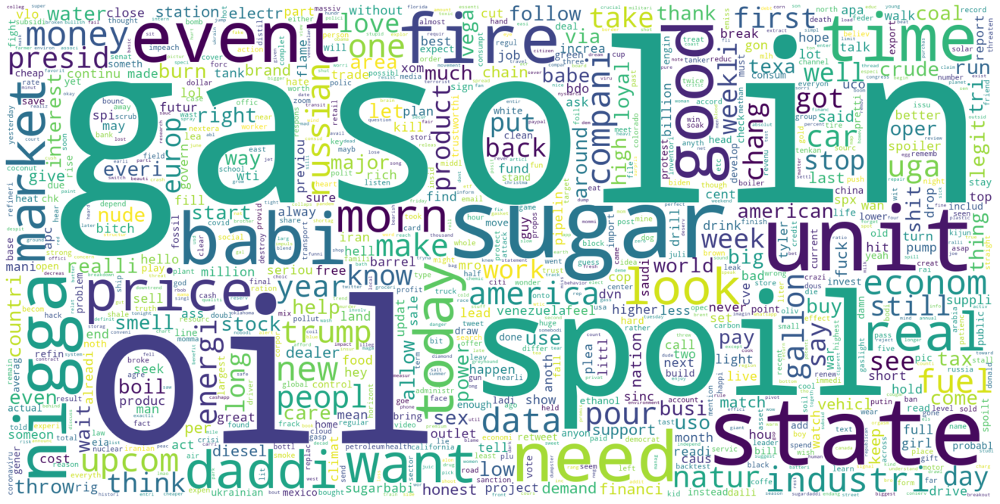

<Figure size 720x504 with 0 Axes>

In [ ]:
# Create word cloud:
word_cloud(gasoline_df, column='clean_text', max_words = 1000)

In [ ]:
# Plot stock prices and daily sector sentiment:
stock = 'UGA'
gasoline_prices_stock = gasoline_prices[gasoline_prices['stock']==stock]
gasoline_gb = gasoline_df.groupby(by=['date']).mean()['sentiment'].reset_index()
gasoline_prices_gb = gasoline_prices_stock.groupby(by=['Date']).mean()[['Open','High','Low','Close']].reset_index()
gasoline_gb['date'] = gasoline_gb['date'].astype(str)
gasoline_prices_gb['Date'] = gasoline_prices_gb['Date'].astype(str)


gasoline_stock = gasoline_gb.merge(gasoline_prices_gb, how='inner', right_on='Date', left_on='date')
plot_stock_sentiment(stock_gb=gasoline_stock)

# Analysis of Covid-19 Tweets

##Load Data

In [ ]:
# Load data:
covid_spread_state_gb = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Output/covid_spread_state_gb.csv")
corona_per_dates_gb = pd.read_csv("drive/My Drive/Colab Notebooks/Big Data/final_project/Output/corona_per_dates_gb.csv")

In [ ]:
input_url = './drive/My Drive/big_data/tables/covid Tweets.csv'
covid_df = pd.read_csv(input_url,low_memory=False)
covid_df

,created_at,id,text,source,in_reply_to_status_id,in_reply_to_user_id,user.id,State_abbv,date,hour,date_and_hour,folder
0,20200428T232406,1.255231e+18,Trump to order meat plants to stay open in pandemic. Safety be damned. Trump can’t stand a day without his burgers. https://t.co/dSOg32GpsV,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",NaN,NaN,1.847131e+07,ID,20200428T000000,23.0,2020-04-28 23,Data/BGU DATA/Covid Tweets/
1,20200408T200939,1.247935e+18,"You know one thing I've learned during this lockdown when it comes to going out (bars, brunch, etc)? That I really… https://t.co/EDOuVzNI7r","<a href=""""https://mobile.twitter.com"""" rel=""""nofollow"""">Twitter Web App</a>",NaN,NaN,1.030198e+08,TX,20200408T000000,20.0,2020-04-08 20,Data/BGU DATA/Covid Tweets/
2,20200318T140334,1.240247e+18,We need to stop killing people so the world can get over this pandemic--that means the entire world. https://t.co/n8aXl8KSBg,"<a href=""""https://mobile.twitter.com"""" rel=""""nofollow"""">Twitter Web App</a>",NaN,NaN,8.083698e+17,OR,20200318T000000,14.0,2020-03-18 14,Data/BGU DATA/Covid Tweets/
3,20200626T173803,1.276525e+18,Uhmmm there is a pandemic on bro https://t.co/KtVN4wPgQq,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>",NaN,NaN,4.280941e+08,CO,20200626T000000,17.0,2020-06-26 17,Data/BGU DATA/Covid Tweets/
4,20200412T080658,1.249202e+18,Reset the atmosphere in your home. It’s time to spiritually cleanse your house. Sweep out those spiritual cob webs… https://t.co/ZAmYpYjUgb,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",NaN,NaN,9.133099e+17,HI,20200412T000000,8.0,2020-04-12 8,Data/BGU DATA/Covid Tweets/
...,...,...,...,...,...,...,...,...,...,...,...,...
2245747,20200331T040852,1.244794e+18,I might as well do heavy full body workouts everyday or every other day during this social distancing 🦁💪 #RealMenPumpIron,"<a href=""""https://mobile.twitter.com"""" rel=""""nofollow"""">Twitter Web App</a>",NaN,NaN,4.093943e+09,KY,20200331T000000,4.0,2020-03-31 4,Data/BGU DATA/Covid Tweets/
2245748,20200224T192655,1.231994e+18,@erinkrakow @hallmarkchannel @SCHeartHome And shootouts,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",1.231756e+18,288378863.0,4.328464e+08,SC,20200224T000000,19.0,2020-02-24 19,Data/BGU DATA/Covid Tweets/
2245749,20200704T053603,1.279243e+18,"@brat2381 According to the White House’s COVID plan, I guess she should just deal with it.","<a href=""""http://twitter.com/#!/download/ipad"""" rel=""""nofollow"""">Twitter for iPad</a>",1.279242e+18,8.599938030667162e+17,2.209607e+09,MI,20200704T000000,5.0,2020-07-04 5.0,Data/BGU DATA/Covid Tweets/
2245750,20200720T040425,1.285018e+18,Day #128 of #socialdistancing #QuarantineLife https://t.co/2CMnbvZKIK,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>",NaN,NaN,4.040109e+07,TN,20200720T000000,4.0,2020-07-20 4.0,Data/BGU DATA/Covid Tweets/


##Data preprocessing

In [ ]:
# Data preprocessing:
cols = ['created_at','id','source', 'text','in_reply_to_status_id','in_reply_to_user_id','user.id','State_abbv']
covid_df = preprocessing(covid_df, specific_columns = cols)

Start Preprocessing
filter unknown sources


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:153: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



remove rows: 58724
Parse Date
Remove duplicates
After pre-proccessing DF shape is 2186968


**Graph show covid cases and Number of Tweets Per Day**

In [ ]:
# Covid tweets count over time:
tweet_count_gb = covid_df.groupby(by='date').count()['id'].reset_index()
tweet_count_gb = tweet_count_gb.rename(columns={'id':'count'})
tweet_count_gb['date'] = tweet_count_gb['date'].astype(str)
tweet_count_with_covid_gb = tweet_count_gb.merge(corona_per_dates_gb, how='left', on='date')
tweet_count_with_covid_gb['covid cases'] = tweet_count_with_covid_gb['covid cases'].fillna(value=0)

t = tweet_count_with_covid_gb['date']
count = tweet_count_with_covid_gb['count']
cases = tweet_count_with_covid_gb['covid cases']
deaths = tweet_count_with_covid_gb['covid deaths']

fig = go.Figure()
fig.add_trace(go.Scatter(
    x=t,
    y= savgol_filter(count,21,3),
    name="count", line=dict(color='green', width=1)
))

fig.add_trace(go.Scatter(
    x=t,
    y=savgol_filter(cases,21,3),
    name="cases",
    yaxis="y2", line=dict(color='orange', width=1)
))

fig.add_trace(go.Scatter(
    x=t,
    y=savgol_filter(deaths,21,3),
    name="deaths",
    yaxis="y3",  line=dict(color='red', width=1)
    
))
# Create axis objects
fig.update_layout(
    xaxis=dict(
        domain=[0.3, 0.7]
    ),
    yaxis=dict(
        title="count",
        titlefont=dict(
            color="green"
        ),
        tickfont=dict(
            color="green"
        )
    ),
    yaxis2=dict(
        title="cases",
        titlefont=dict(
            color="orange"
        ),
        tickfont=dict(
            color="orange"
        ),
        anchor="free",
        overlaying="y",
        side="left",
        position=0.22
    ),
    yaxis3=dict(
        title="deaths",
        titlefont=dict(
            color="red"
        ),
        tickfont=dict(
            color="red"
        ),
        anchor="x",
        overlaying="y",
        side="right"
    )
)

# Update layout properties
fig.update_layout(
    title_text="Covid tweets count over time in USA"    
)
fig.show()

##Clean Text and Features Extract

In [ ]:
%%time
# Clean text:
min_text_len = 2
min_word_len = 3
covid_df['clean_text'] = covid_df['text'].apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,
                                                                                    min_word_len=min_word_len, remove_hashtag=False))
covid_df = covid_df[~covid_df['clean_text'].isna()]

CPU times: user 18min 36s, sys: 33.6 s, total: 19min 10s
Wall time: 19min 11s


In [ ]:
%%time
covid_df['clean_text_w2v'] = covid_df['text'].apply(lambda x: preprocess_tweet(tweet=x, min_text_len=min_text_len,min_word_len=min_word_len))   
covid_df = covid_df[~covid_df['clean_text_w2v'].isna()]                                                                 

CPU times: user 16min 50s, sys: 32.4 s, total: 17min 22s
Wall time: 17min 24s


In [ ]:
%%time
# Extract sentiment:
covid_df['sentiment'] = covid_df['clean_text_w2v'].progress_apply(lambda x: get_sentiment(x))

In [ ]:
covid_df = pd.read_csv('./drive/My Drive/big_data/clean_files/clean_covid_tweets2.csv',engine='python' )
# covid_df = pd.read_csv('clean_covid_tweets.csv',low_memory=False )
covid_df

,Unnamed: 0,created_at,id,source,text,in_reply_to_status_id,in_reply_to_user_id,user.id,State_abbv,source_clean,date,clean_text,clean_text_w2v,sentiment
0,0,2019-06-01 03:00:11,1.134611e+18,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>","It’s been even more infuriating since I’ve had kids and they have to do regular “lockdown” drills...Terrifying, dep… https://t.co/Dw6Kc0x0fc",NaN,NaN,1.383198e+09,NC,iPhone,2019-06-01,even infuri sinc kid regular covid drill terrifi dep,even infuri sinc kid regular lockdown drill terrifi dep,0.000000
1,1,2019-06-01 03:00:31,1.134611e+18,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>",@Kokomothegreat @realDonaldTrump They're not going to give a shit until it happens to one of their own family members.,1.134610e+18,8.813367e+17,1.060328e+18,IL,Android,2019-06-01,give shit covid one famili member,give shit happen one famili member,-0.200000
2,2,2019-06-01 03:18:37,1.134615e+18,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",Happy Friday! We shipped our thank you gifts for the fund drive today! Let us know when you get them! https://t.co/sUOp7CebO3,NaN,NaN,3.035490e+09,NH,iPhone,2019-06-01,happi friday shi covid thank gift fund drive today let know get,happi friday ship thank gift fund drive today let know get,0.000000
3,3,2019-06-01 03:36:44,1.134620e+18,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>",@SaraCarterDC @seanhannity @realDonaldTrump Something needs to happen soon. This crap is getting old fast.,1.134613e+18,2.520227e+07,9.479050e+17,KS,Android,2019-06-01,someth need covid soon crap get old fast,someth need happen soon crap get old fast,-0.166667
4,4,2019-06-01 03:42:05,1.134621e+18,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",@MarkDice and @realDonaldTrump here is an authentic video of @tedlieu celebrating a recent appearance on… https://t.co/ddegXCSPDz,NaN,3.503949e+07,8.163895e+17,DE,iPhone,2019-06-01,authent video celebr recent covid aranc,authent video celebr recent appear,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2133362,2186963,2020-07-21 02:59:44,1.285364e+18,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>",@ReElect_Nobody He'd only be a miracle worker by going away he's by far the worst thing to happen to this country,1.285362e+18,1.259555e+18,1.217367e+18,MI,Android,2020-07-21,miracl worker away far worst thing covid countri,miracl worker away far worst thing happen countri,-0.450000
2133363,2186964,2020-07-21 02:59:45,1.285364e+18,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>",@VincentCrypt46 I don’t see why charades are necessary. I’m over all the nonsense.I won’t wear a mask. Over it and… https://t.co/JELmnrsDMA,1.285354e+18,1.093774e+18,4.622079e+07,SD,iPhone,2020-07-21,see charad necessari nonsens covid,see charad necessari nonsens wear mask,0.000000
2133364,2186965,2020-07-21 02:59:52,1.285364e+18,"<a href=""""https://mobile.twitter.com"""" rel=""""nofollow"""">Twitter Web App</a>",Update: Health department now links 38 COVID-19 cases to Hazard High School football team; almost half are contacts… https://t.co/QVkkzdT92h,NaN,NaN,8.816883e+17,KY,Mobile device,2020-07-21,updat health depart link covid case hazard high school footbal team almost half contact,updat health depart link covid case hazard high school footbal team almost half contact,-0.003333
2133365,2186966,2020-07-21 02:59:54,1.285364e+18,"<a href=""""http://twitter.com/download/iphone"""" rel=""""nofollow"""">Twitter for iPhone</a>","That’s pandemic baseball, suzyn https://t.co/EfzLBaaRFw",NaN,NaN,3.451063e+08,NY,iPhone,2020-07-21,covid basebal suzyn,pandem basebal suzyn,0.000000


**Map show sentiment over time by County (Hover Mouse: Covid-Cases and Covid-Deaths)**

In [ ]:
# USA covid tweets sentiment:
covid_per_country_df = covid_df.groupby(by=['date','State_abbv']).mean().reset_index()
covid_per_country_df['date'] = covid_per_country_df['date'].apply(lambda x: str(x).replace(" 00:00:00",''))
covid_per_country_gb = covid_per_country_df.merge(covid_spread_state_gb, on=['date','State_abbv'], how='left')
covid_per_country_gb['covid cases'] = covid_per_country_gb['covid cases'].fillna(value=0) 
covid_per_country_gb['covid deaths'] = covid_per_country_gb['covid deaths'].fillna(value=0)
covid_per_country_gb['covid cases'] = covid_per_country_gb['covid cases'].astype(int)
covid_per_country_gb['covid deaths'] = covid_per_country_gb['covid deaths'].astype(int)
covid_per_country_gb = covid_per_country_gb[['date','State_abbv','sentiment','covid cases','covid deaths']]
px.choropleth(covid_per_country_gb, locations='State_abbv',
              locationmode='USA-states', scope="usa", hover_data=['covid cases','covid deaths'], color='sentiment',animation_frame="date", color_continuous_scale="ylgn", title="Covid tweets sentiment per state")

##Topic Model - In the corona field

#####prepare data

In [ ]:
%%time
# Create doc per day:
covid_df['tokens_t'] = covid_df['clean_text'].apply(lambda x: x.split())

CPU times: user 5.01 s, sys: 635 ms, total: 5.65 s
Wall time: 5.65 s


In [ ]:
%%time
covid_df['tokens_w'] = covid_df['clean_text_w2v'].apply(lambda x: x.split())

CPU times: user 5.27 s, sys: 1.66 s, total: 6.93 s
Wall time: 6.93 s


In [ ]:
# Create bigrams:
min_count=5
threshold=100
covid_bigram = gensim.models.Phrases(covid_df['tokens_t'], min_count=min_count, threshold=threshold)
covid_bigram_mod = gensim.models.phrases.Phraser(covid_bigram)
covid_unigram_and_bigram = [covid_bigram_mod[tweet] for tweet in covid_df['tokens_t']]
# Create Dictionary:
covid_id2word = corpora.Dictionary(covid_unigram_and_bigram)

# Term Document Frequency:
covid_corpus = [covid_id2word.doc2bow(tweet) for tweet in covid_unigram_and_bigram]

In [ ]:
from gensim.corpora import Dictionary
# basic_gensim_path = "/content/drive/My Drive/big_data/models/lda/utils/"
# covid_id2word.save_as_text(basic_gensim_path + "covid_id2word.gensim")
# save_pickle_object(covid_corpus,'covid_corpus', basic_gensim_path)
covid_id2word = Dictionary.load_from_text(basic_gensim_path + "covid_id2word.gensim")
covid_corpus = load_pickle_object('covid_corpus',basic_gensim_path)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning:

This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function



Info: uploading covid_corpus pickle file.



#####Build LDA model

In [ ]:
warnings.filterwarnings("ignore",category=DeprecationWarning)

# Build LDA model:
from gensim.models.callbacks import PerplexityMetric
perplexity_logger = PerplexityMetric(corpus=covid_corpus, logger='shell')
coherence_logger  = gensim.models.callbacks.CoherenceMetric(corpus=covid_corpus, coherence="u_mass", logger='shell')

# Config:
num_topics = 4
random_state = 11
update_every = 1
chunksize = 5000
passes=10
alpha='auto'
per_word_topics=True

lda_covid_model = gensim.models.ldamodel.LdaModel(corpus=covid_corpus,
                                           id2word=covid_id2word,
                                           num_topics=num_topics, 
                                           random_state=random_state,
                                           update_every=update_every,
                                           chunksize=chunksize,
                                           passes=passes,
                                           alpha=alpha, callbacks=[coherence_logger],
                                           per_word_topics=per_word_topics)

**Load Pretrained Models (Optional)**

In [ ]:
lda_covid_model_3_topics = gensim.models.ldamodel.LdaModel.load('./drive/My Drive/big_data/models/lda/lda_covid3/lda_covid3.model')

In [ ]:
lda_covid_model_4_topics = gensim.models.ldamodel.LdaModel.load('./drive/My Drive/big_data/models/lda/lda_covid_4/lda_covid_4.model')

In [ ]:
lda_covid_model_5_topics = gensim.models.ldamodel.LdaModel.load('./drive/My Drive/big_data/models/lda/lda_covid_5/lda.model')

In [ ]:
models ={'LDA 3 Topics':lda_covid_model_3_topics , 'LDA 4 Topics': lda_covid_model_4_topics, 'LDA 5 Topics' : lda_covid_model_5_topics}

###Evaluate

In [ ]:
warnings.filterwarnings("ignore",category=DeprecationWarning)
for modelLDA_key in models:
  print(f'model {modelLDA_key}:')
  coherence_model_lda = CoherenceModel(model=models[modelLDA_key], texts=covid_unigram_and_bigram, dictionary=covid_id2word, coherence='c_v')
  coherence_lda = coherence_model_lda.get_coherence()
  print('Coherence Score: ', coherence_lda)

model LDA 3 Topics:
Coherence Score:  0.21632057025353868
model LDA 4 Topics:
Coherence Score:  0.49137178067051973
model LDA 5 Topics:
Coherence Score:  0.48707362407889876


In [ ]:
lda_covid_model = lda_covid_model_4_topics

**We Choose Model with 4 Topics By Maximum Coherence Score**

In [ ]:
# Show topics:
for index, topic in lda_covid_model.show_topics(formatted=False, num_words= 10):
  print('Topic: {} \nWords: {}'.format(index+1, [w[0] for w in topic]))

Topic: 1 
Words: ['coronaviru', 'test', 'case', 'new', 'death', 'state', 'viru', 'via', 'posit', 'due']
Topic: 2 
Words: ['covid', 'pandem', 'mask', 'wear', 'trump', 'vaccin', 'american', 'respons', 'world', 'face']
Topic: 3 
Words: ['get', 'work', 'day', 'corona', 'home', 'lockdown', 'back', 'got', 'school', 'today']
Topic: 4 
Words: ['peopl', 'quarantin', 'like', 'one', 'say', 'happen', 'time', 'need', 'social', 'know']


###Analysis Topic Per Tweet

In [ ]:
covid_df = pd.read_pickle('/content/drive/My Drive/big_data/covid_df_with_corpus.pickle',compression='bz2')
covid_df_sample = covid_df.sample(frac=0.5)

In [ ]:
# Extract topic per day:
covid_topics_df, covid_topic_cols = get_topics_per_doc(ldamodel=lda_covid_model, corpus=covid_df_sample['covid_corpus'])

In [ ]:
# covid_data_and_topics_df = concat_dfs_by_col(list_of_dfs=[covid_df_sample, covid_topics_df])
covid_data_and_topics_df = covid_data_and_topics_df.read_csv('./drive/My Drive/big_data/covid_data_and_topics4_df.csv')
covid_data_and_topics_df.head(1)

,Unnamed: 0,created_at,id,source,text,in_reply_to_status_id,in_reply_to_user_id,user.id,State_abbv,source_clean,date,clean_text,clean_text_w2v,sentiment,tokens_t,tokens_w,covid_corpus,Topic 0,Topic 1,Topic 2,Topic
0,2059818,2020-07-09 07:57:08,1.281090e+18,"<a href=""""http://twitter.com/download/android"""" rel=""""nofollow"""">Twitter for Android</a>","@joeaintfunny @MaineDOT1 How about """"Go home. There is a global pandemic happening.""""",1.281084e+18,277640934.0,32578479.0,ME,Android,2020-07-09,home global covid covid ning,home global pandem happen,0.0,"[home, global, covid, covid, ning]","[home, global, pandem, happen]","[(11, 1), (56, 1), (1318, 1), (3189, 1)]",0.85842,0.085858,0.055721,Topic 0


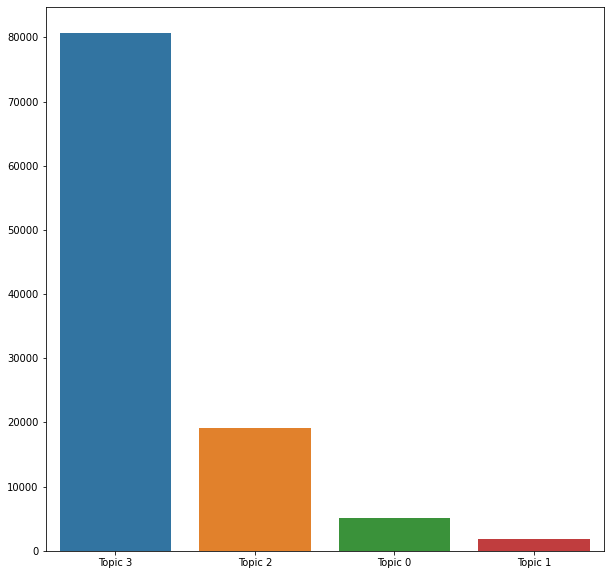

In [ ]:
D = dict(Counter(covid_data_and_topics_df['Topic']))
rcParams['figure.figsize'] = 10, 10
ax = sns.barplot(x= list(D.keys()) , y=list(D.values()))

###Tweet2vec

In [ ]:
def fix_topic(topic):
  if '1' in topic:
    return 0
  else return topic

df_filter_uncommon_topics = df_filter_uncommon_topics['Topic'].apply(lambda x: fix_topic(x))

In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the token is not in vocabulary
            print(word)
            continue
    if count != 0:
        vec /= count
    return vec

tokens = df_filter_uncommon_topics[:10]['tokens_w']
# Convert tweet to vector:
wordvec_arrays = np.zeros((len(tokens), 300)) 
for i in range(len(tokens)):
    wordvec_arrays[i,:] = word_vector(tokens[i], 300)
wordvec_df = pd.DataFrame(wordvec_arrays)

In [ ]:
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the token is not in vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

tokens = df_filter_uncommon_topics['tokens_w']
# Convert tweet to vector:
wordvec_arrays = np.zeros((len(tokens), 300)) 
for i in range(len(tokens)):
    wordvec_arrays[i,:] = word_vector(literal_eval(tokens[i]), 300)
wordvec_df = pd.DataFrame(wordvec_arrays)


##Visualization tweets using PCA

In [ ]:
# Visualization tweets using PCA:
pca = PCA(n_components=2)
pca_result = pca.fit_transform(wordvec_arrays)
df_filter_uncommon_topics['pca-one'] = pca_result[:,0]
df_filter_uncommon_topics['pca-two'] = pca_result[:,1] 
fig = px.scatter(df_filter_uncommon_topics, x="pca-one", y="pca-two", color="Topic")
fig.show()

# Analysis of Randomly Sampled Tweets -S3 (AWS) code

In [ ]:
def load_data_from_s3(s3_client, bucket, key):
    
    response = s3_client.list_objects_v2(
                Bucket=bucket,
                Prefix =key,
                MaxKeys=100 )

    # get file names:
    file_list = []
    for f in response['Contents']:
        if "csv" in f['Key']:
            file_list.append("s3://"+str(bucket)+"/"+f['Key'])

    # Load files:
    dfs = []
    for file in tqdm(file_list):
        try:
          df = pd.read_csv(file, low_memory=False)
        except:
          try:
            df = pd.read_csv(file, engine='python')
          except:
            try:
              df = pd.read_csv(file,sep='\t',encoding="ISO-8859-1")
            except:
                try:
                    df = pd.read_csv(file, ep='\\t',lineterminator='\\r', engine='python', header='infer')
                except:
                  print("filed to load file: "+ file)

        dfs.append(df)

    # Merge data:
    df = concat_dfs_by_row(list_of_dfs=dfs)
    print("\nDF shape is {s}".format(s=str(df.shape[0])))

    return df

def save_pickle_file_to_s3(s3_client, df, bucket, key, obj_name):
    
    serializedMyData = cPickle.dumps(df)
    s3_client.put_object(Bucket=bucket,Key=obj_name, Body=serializedMyData)
    
def save_df_to_s3_as_pickle_chuncks(s3_client, bucket, df, file_name, chunk_size, key):
    
    df_list = np.array_split(df, chunk_size)
    
    for d in tqdm(range(len(df_list))):
        name = file_name +"_" + str(d)
        chunck_df = df_list[d]
        save_pickle_file_to_s3(s3_client=s3_client, df=chunck_df, bucket=bucket, key=key, obj_name=str(name)+'.obj')

def compute_coherence_values(dictionary, corpus, texts, limit, random_state, update_every, passes, alpha, per_word_topics, chunksize, start=2, step=3):

    
    import warnings
    warnings.filterwarnings("ignore",category=DeprecationWarning)
    coherence_values = []
    model_list = []
    for num_topics in tqdm(range(start, limit, step)):
        
        model = gensim.models.LdaMulticore(workers=mp.cpu_count()-2,corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=random_state,
                                                chunksize=chunksize, passes=passes, per_word_topics=per_word_topics)

        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [ ]:
import _pickle as cPickle
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from scipy.signal import savgol_filter

In [ ]:
# aws:
import boto3
from s3fs.core import S3FileSystem

# Configs:
s3_resource = boto3.resource('s3')
s3_client = boto3.client('s3')
s3_file = S3FileSystem()
bucket='bigdatabgu'

!pip install gensim
!pip install spacy

In [ ]:
# Load data from aws:
random_tweets_df = load_data_from_s3(s3_client=s3_client, bucket='bigdatabgu', key='Random Tweets')
covid_spread_state_gb = pd.read_csv("s3://bigdatabgu/covid_spread_state_gb.csv")

100%|██████████| 70/70 [00:00<00:00, 52195.78it/s]



DF shape is 34144799


In [ ]:
# Data preprocessing:
cols = ['created_at','id','text','in_reply_to_status_id','in_reply_to_user_id','user.id','State_abbv']
random_tweets_df = preprocessing(random_tweets_df, specific_columns = cols)

Start Preprocessing


  0%|          | 0/34144799 [00:00<?, ?it/s]

Parse Date


100%|██████████| 34144799/34144799 [02:16<00:00, 249690.50it/s] 


Remove duplicates
After pre-proccessing DF shape is 31877974


In [ ]:
# Tag corona tweets:
random_tweets_df['covid_tweet'] = random_tweets_df['text'].progress_apply(lambda x: is_relevent_tweet(text=x,words_list=corona_keyword))

100%|██████████| 31877974/31877974 [10:41<00:00, 49695.10it/s]


In [ ]:
min(random_tweets_df['created_at'])

Timestamp('2019-06-01 03:00:00')

In [ ]:
max(random_tweets_df['created_at'])

Timestamp('2020-07-21 03:00:00')

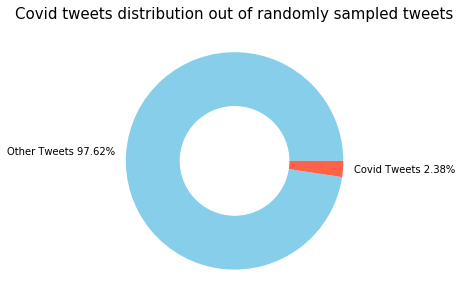

In [ ]:
# Create pie chart:
create_pie_chart(df=random_tweets_df, group_by_col='covid_tweet', count_col='id', title='Covid tweets distribution out of randomly sampled tweets')

In [ ]:
import dask.dataframe as dd
import multiprocessing
from dask.distributed import progress

# Clean text:
min_text_len = 2
min_word_len = 3
ddf= dd.from_pandas(random_tweets_df, npartitions= mp.cpu_count()-2)
random_tweets_df['clean_text'] = ddf.map_partitions(lambda df: df.apply(lambda x: preprocess_tweet(tweet=x['text'],
                                                               min_text_len=min_text_len,
                                                               min_word_len=min_word_len,
                                                               keywords_list=corona_keyword,
                                                               keywords_replacement_word='covid',
                                                               remove_hashtag=False),axis=1)).compute(scheduler='processes')

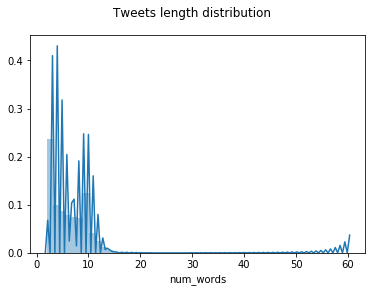

In [ ]:
# Tweet length:
random_tweets_df['num_words'] = random_tweets_df['clean_text'].apply(lambda x: len(x.split()))
plot_histogram(df=random_tweets_df, column='num_words', title='Tweets length distribution')

In [ ]:
random_tweets_df['tokens'] = random_tweets_df['clean_text'].progress_apply(lambda x: x.split())

In [ ]:
# Save pickle:
key = 'output'
save_df_to_s3_as_pickle_chuncks(s3_client=s3_client, bucket=bucket, df=random_tweets_df, file_name='random_tweets_df_after_clean_text', chunk_size=10, key=key)

## LDA

### Grid search on num of topics

In [ ]:
# Sample from df:
sub_random_tweets_df = random_tweets_df.sample(frac=0.1)

In [ ]:
# Create bigrams:
min_count=50
threshold=300
random_tokens = sub_random_tweets_df['tokens']
random_tweets = sub_random_tweets_df['clean_text']
random_bigram = gensim.models.Phrases(random_tokens, min_count=min_count, threshold=threshold)
random_bigram_mod = gensim.models.phrases.Phraser(random_bigram)
random_unigram_and_bigram = [random_bigram_mod[tweets_tokens] for tweets_tokens in tqdm(random_tokens)]

100%|██████████| 2794485/2794485 [00:52<00:00, 53240.61it/s]


In [ ]:
# Create Dictionary:
random_id2word = corpora.Dictionary(random_unigram_and_bigram)

# Term Document Frequency:
random_corpus = [random_id2word.doc2bow(tweet) for tweet in random_unigram_and_bigram]

In [ ]:
# Train LDA model and use grid search to find the best num of topics:
start=20
limit=150
step=10
chunksize = 50000
random_state=11
update_every=1
passes=10
alpha='auto'
per_word_topics=True

model_list, coherence_values = compute_coherence_values(dictionary=random_id2word,
                                                        corpus=random_corpus,
                                                        texts=random_unigram_and_bigram,
                                                        start=start,
                                                        limit=limit,
                                                        step=step,
                                                        random_state=random_state,
                                                        update_every=update_every,
                                                        passes=passes,
                                                        alpha=alpha,
                                                        per_word_topics=per_word_topics,
                                                        chunksize=chunksize)

100%|██████████| 13/13 [4:03:09<00:00, 1122.28s/it] 


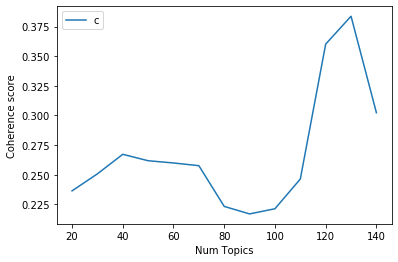

In [ ]:
# Plot the coherence values:
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [ ]:
# Get best model:
model_selected = np.argmax(coherence_values)
best_model = model_list[model_selected]
model_topics = best_model.show_topics(formatted=False)

In [ ]:
# Visualize the topics:
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(model_topics, random_corpus, covid_id2word)
vis

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning:

This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function



PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
101    0.163831 -0.054933       1        1  4.650940
99     0.141300  0.072214       2        1  3.741057
36     0.039586 -0.082446       3        1  2.289762
52     0.047436 -0.022597       4        1  1.583500
72     0.118009  0.134144       5        1  1.520607
...         ...       ...     ...      ...       ...
27     0.021451  0.034413     126        1  0.361354
81    -0.060966  0.050103     127        1  0.356165
54     0.075516  0.021402     128        1  0.340807
61     0.054268  0.027402     129        1  0.315446
71     0.041277  0.026027     130        1  0.297781

[130 rows x 5 columns], topic_info=         Term       Freq      Total  Category  logprob  loglift
322782  trump  39.000000  39.000000   Default  30.0000  30.0000
184341   look  31.000000  31.000000   Default  29.0000  29.0000
185348   love  28.000000  28.000000   Default  28.0000  28.0000
140310   home  30.000000  30.000000   Default  27.0000  27.0000
310385  thank  23.000000  23.000000   Default  26.0000  26.0000
...       ...        ...        ...       ...      ...      ...
180615   like   0.166621  74.147491  Topic130  -4.9114  -0.2815
119320    get   0.150516  64.095650  Topic130  -5.0130  -0.2375
271679    say   0.134047  32.839298  Topic130  -5.1289   0.3154
125092    got   0.128901  32.707668  Topic130  -5.1681   0.2802
170644   know   0.120277  41.316700  Topic130  -5.2373  -0.0227

[5030 rows x 6 columns], token_table=        Topic      Freq     Term
term                            
984        53  1.261611     abil
1043       37  1.043778      abl
1410       24  1.016729  absolut
1537      123  1.205888     abus
1699      114  0.818142   accept
...       ...       ...      ...
357742     44  1.153706    you�r
358170    102  1.142729      yup
358447     89  0.849114    y�all
359257     85  0.883466     zero
359873     27  1.847377     zone

[2488 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[102, 100, 37, 53, 73, 77, 16, 121, 123, 31, 98, 12, 1, 112, 118, 20, 38, 13, 18, 115, 124, 42, 23, 129, 76, 116, 71, 106, 86, 78, 64, 81, 85, 9, 111, 14, 11, 7, 69, 63, 21, 3, 114, 15, 10, 36, 60, 120, 65, 54, 99, 96, 67, 22, 40, 74, 105, 24, 90, 52, 130, 126, 88, 80, 94, 43, 61, 30, 125, 113, 58, 51, 46, 34, 122, 2, 57, 35, 70, 59, 109, 92, 91, 26, 104, 6, 97, 4, 75, 93, 83, 25, 127, 45, 119, 95, 39, 103, 19, 56, 47, 66, 128, 117, 27, 101, 107, 17, 68, 79, 49, 48, 50, 5, 33, 8, 84, 41, 44, 89, 32, 108, 87, 110, 29, 28, 82, 55, 62, 72])

In [ ]:
import time
time.sleep(20000)

### Train LDA on all data

In [ ]:
# Convert to sframe:
random_tweets_sf = tc.SFrame(random_tweets_df)

In [ ]:
# Create BOW:
docs = tc.text_analytics.count_words(random_tweets_sf['clean_text'])

In [ ]:
# Train a topic model:
import multiprocessing as mp
tc.config.set_runtime_config('TURI_DEFAULT_NUM_PYLAMBDA_WORKERS', mp.cpu_count()-2)
num_topics = 130
num_iterations = 100
topic_model = tc.topic_model.create(docs, num_topics=num_topics, num_iterations=num_iterations)

Learning a topic model

Number of documents  27944847

Vocabulary size   1365429

Running collapsed Gibbs sampling

+-----------+---------------+----------------+-----------------+

| Iteration | Elapsed Time  | Tokens/Second  | Est. Perplexity |

+-----------+---------------+----------------+-----------------+

| 10        | 3m 17s        | 9.21055e+06    | 0               |

| 20        | 6m 14s        | 9.42119e+06    | 0               |

| 30        | 9m 7s         | 9.72482e+06    | 0               |

| 40        | 11m 54s       | 1.00609e+07    | 0               |

| 50        | 14m 36s       | 1.0295e+07     | 0               |

| 60        | 17m 14s       | 1.04536e+07    | 0               |

| 70        | 19m 50s       | 1.06256e+07    | 0               |

| 80        | 22m 24s       | 1.07463e+07    | 0               |

| 90        | 24m 58s       | 1.07768e+07    | 0               |

| 100       | 27m 30s       | 1.08337e+07    | 0               |

+-----------+---------------+----------------+-----------------+

In [ ]:
# Save model:
topic_model.save("s3://bigdatabgu/topic_model_dframe_130_topics_100_prc")

In [ ]:
# Load model:
topic_model = tc.load_model("s3://bigdatabgu/topic_model_dframe_130_topics_100_prc")

In [ ]:
# Topics generated from LDA Model:
words_per_topic_df = topic_model.get_topics().to_dataframe()
topics = words_per_topic_df.groupby(by='topic')['word'].apply(np.array).reset_index()
topics = topics.rename(columns={"word": "Words", "topic": "Topic"})
topics['Topic'] = topics['Topic']+1

In [ ]:
print("Topics generated from LDA Model:")
topics.head(10)

Topics generated from LDA Model:


,Topic,Words
0,1,"[like, look, lol, realli, wow]"
1,2,"[year, old, ago, month, last]"
2,3,"[stay, home, come, safe, strong]"
3,4,"[one, time, smoke, got, day]"
4,5,"[player, think, deserv, hous, team]"
5,6,"[john, michael, chri, brown, mike]"
6,7,"[hair, cut, face, hand, skin]"
7,8,"[ass, bitch, fuck, nigga, shit]"
8,9,"[like, look, sound, even, act]"
9,10,"[ask, question, answer, would, think]"


In [ ]:
# Predict topic:
random_tweets_sf['Topic'] = topic_model.predict(docs)

In [ ]:
random_tweets_sf['docs'] = docs

In [ ]:
sample_random_tweets_sf = random_tweets_sf.sample(fraction=0.05)

In [ ]:
# Predict topic probability:
topic_probability_array = topic_model.predict(sample_random_tweets_sf['docs'],output_type='probability')

topic_dict = defaultdict(list)
for probabilities in tqdm(topic_probability_array):
  topic_num = 1
  for topic_prob in probabilities:
    topic_dict['Topic '+str(topic_num)].append(topic_prob)
    topic_num+=1

In [ ]:
topic_df = pd.DataFrame(topic_dict)
cols = list(topic_df.columns)
topic_sf = tc.SFrame(topic_df)
topic_prob_sf = sample_random_tweets_sf[['created_at','covid_tweet','date']].add_columns(topic_sf)
topic_prob_sf.head(5)

created_at,covid_tweet,date,Topic 1,Topic 2
2019-06-01 03:00:00+00:00,0,2019-06-01 00:00:00,0.00620347394540943,0.00620347394540943
2019-06-01 03:00:01+00:00,0,2019-06-01 00:00:00,0.006410256410256411,0.006410256410256411
2019-06-01 03:00:01+00:00,0,2019-06-01 00:00:00,0.007122507122507123,0.007122507122507123
2019-06-01 03:00:06+00:00,0,2019-06-01 00:00:00,0.00725689404934688,0.00725689404934688
2019-06-01 03:00:07+00:00,0,2019-06-01 00:00:00,0.007122507122507123,0.007122507122507123
Topic 3,Topic 4,Topic 5,Topic 6,Topic 7
0.00620347394540943,0.00620347394540943,0.00620347394540943,0.00620347394540943,0.00620347394540943
0.006410256410256411,0.006410256410256411,0.006410256410256411,0.006410256410256411,0.006410256410256411
0.007122507122507123,0.007122507122507123,0.007122507122507123,0.007122507122507123,0.007122507122507123
0.00725689404934688,0.00725689404934688,0.00725689404934688,0.00725689404934688,0.00725689404934688


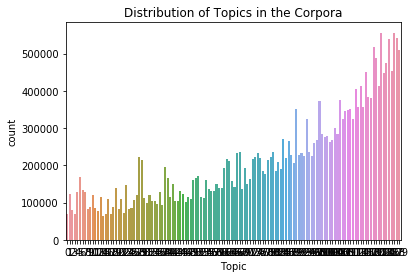

In [ ]:
# Distribution of Topics in the Corpora:
import turicreate.aggregate as agg
topic_gb = random_tweets_sf.groupby(key_column_names='Topic',operations={'id': agg.COUNT()})
topic_gb = topic_gb.to_dataframe()
topic_gb = topic_gb.rename(columns={"id": "count"})
ax = sns.barplot(x="Topic",y='count', data=topic_gb).set_title('Distribution of Topics in the Corpora')

In [ ]:
# Get daily topic distribution:
topic_prob_gb = topic_prob_sf.groupby(key_column_names='date',operations={cols[0]: agg.AVG(cols[0])})
for col in cols[1:]:
  gb = topic_prob_sf.groupby(key_column_names='date',operations={col: agg.AVG(col)})
  topic_prob_gb = topic_prob_gb.add_columns(gb[[col]])

In [ ]:
topic_prob_gb = topic_prob_gb.to_dataframe()
topic_prob_gb.head(5)

,date,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,...,Topic 121,Topic 122,Topic 123,Topic 124,Topic 125,Topic 126,Topic 127,Topic 128,Topic 129,Topic 130
0,2020-06-14,0.007690,0.007500,0.007625,0.007731,0.007578,0.007586,0.007666,0.007825,0.007700,...,0.008036,0.007638,0.007711,0.007679,0.007658,0.007450,0.007667,0.007566,0.007659,0.007522
1,2019-12-10,0.007646,0.007718,0.007534,0.007619,0.007655,0.007817,0.007565,0.007630,0.007657,...,0.007599,0.007622,0.007741,0.007749,0.007764,0.007857,0.007603,0.007696,0.007652,0.007556
2,2020-03-27,0.007628,0.007573,0.007981,0.007565,0.007446,0.007690,0.007707,0.007637,0.007584,...,0.009674,0.007487,0.007921,0.007569,0.007904,0.007510,0.007563,0.007487,0.007745,0.007547
3,2019-10-28,0.007630,0.007650,0.007648,0.007637,0.008075,0.007879,0.007669,0.007720,0.007649,...,0.007572,0.007748,0.007706,0.007670,0.007707,0.008053,0.007685,0.007687,0.007750,0.007700
4,2019-12-06,0.007644,0.007905,0.007562,0.007592,0.007780,0.007737,0.007869,0.007866,0.007641,...,0.007735,0.007650,0.007775,0.007599,0.007678,0.007847,0.007663,0.007760,0.007832,0.007577


In [ ]:
topic_prob_gb['date_str'] = topic_prob_gb['date'].astype(str)

In [ ]:
daily_topic_dist_df = topic_prob_gb.merge(corona_per_dates_gb, left_on='date_str', right_on='date', how='left')
daily_topic_dist_df['covid cases'] = daily_topic_dist_df['covid cases'].fillna(value=0)

In [ ]:
daily_topic_dist_df = daily_topic_dist_df.sort_values(by='date_str', ascending=True)

In [ ]:
# Select only top topics:
k=20
top_k_topics = list(topic_gb.sort_values(by='count', ascending=False)[:k]['Topic'])

# Add 1 to topic number (like before):
named_top_k_topics = list(np.array(top_k_topics)+1)

# Filter df by topics:
cols = []
for topic in top_k_topics:
    cols.append("Topic " + str(topic))
    
cols.append("date_x")
cols.append('covid cases')
daily_top_topic_dist_df = daily_topic_dist_df[cols]
cols.remove("date_x")
cols.remove("covid cases")

In [ ]:
# Trend of Topics over Time:

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

for topic in cols:
    
    fig.add_trace(
      go.Scatter(x=daily_top_topic_dist_df['date_x'], y=savgol_filter(daily_top_topic_dist_df[topic],11,3), name=topic),
      secondary_y=False,)

# Add traces
fig.add_trace(
      go.Scatter(x=daily_top_topic_dist_df['date_x'], y=savgol_filter(daily_top_topic_dist_df['covid cases'],11,3), name="Covid Cases"),
      secondary_y=True,
)


# Set x-axis title
fig.update_xaxes(title_text="Date")
# Set y-axes titles
fig.update_yaxes(title_text="<b>Topic Distribution</b>", secondary_y=False)
fig.update_yaxes(title_text="<b>Covid Cases</b>", secondary_y=True)
fig.show()

In [ ]:
# Terms of top topics:
topics[topics['Topic'].isin(top_k_topics)]

,Topic,Words
97,98,"[could, would, wish, think, imagin]"
105,106,"[cross, die, anim, right, dead]"
111,112,"[one, got, want, say, time]"
112,113,"[trump, lie, report, investig, presid]"
113,114,"[care, take, health, mental, ill]"
114,115,"[play, game, stream, tonight, fun]"
115,116,"[one, thing, think, time, favorit]"
116,117,"[watch, movi, show, episod, film]"
117,118,"[get, got, time, one, work]"
118,119,"[media, social, use, data, model]"
